In [87]:
# Goal: We want to predict who will experience financial distress in the next two years. 
# For this assignment, I assume that a loan-lending company has limited resources and would like to 
# know which individuals to check in with to determine solutions/know which loans are more likley to
# default in advance.
# The company can only check in with 1000 individuals per month. Which individuals should the company reach out to?
# Thus, we are interested in precision and recall in our top 1000. Since we value them equally, 
# we will consider the F1-score. 

import time
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [88]:
# Import custom modules
import exploration
import preprocess
import predictions
import evaluation

In [89]:
#ML imports
from collections import Counter
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler

In [90]:
#Notebook commands
from IPython.display import Image  
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

%matplotlib inline

## Tasks:

In this homework, you'll continue to build the Machine Learning pipeline. The goal is to improve the pipeline based on the feedback from previous assignments, and add a few components based on what we've covered in the past few lectures. More specifically, you need to:

Coding Assignment:

1. Fix and improve the pipeline code you submitted for the last assignment based on the feedback from the TAs. if something critical was pointed out in the feedback, you need to fix it. 

2. Add more classifiers to the pipeline. I’d recommend at least having Logistic Regression, K-Nearest Neighbor, Decision Trees, SVM, Random Forests, Boosting, and Bagging. The code should have a parameter for running one or more of these classifiers and your analysis should run all of them.

3. Experiment with different parameters for these classifiers (different values of k for example, as well as parameters that other classifiers have). You should look at the sklearn documentation to see what parameter each classifier can take and what the default values sklearn selects.

4. Add additional evaluation metrics that we've covered in class to the pipeline (accuracy, precision at different levels, recall at different levels, F1, area under curve, and precision-recall curves)

5. Once you've set up the improved pipeline, you can run the data from the last assignment and compare the performance of each classifier on each evaluation metric and other dimensions (such as training/test speed). The code should produce a comparison table.

In [91]:
X_train, X_test, y_train, y_test = exploration.read_data_from_csv("data/credit-data.csv", 0, 
                                                                  True, "SeriousDlqin2yrs", 0.33)
data = X_train.join(y_train)
data.head()

,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs
PersonID,,,,,,,,,,,,
87936,0.000000,68,60804,0,798.000000,NaN,4,0,1,0,0.0,0
3893,1.000000,34,60644,0,0.058946,4325.0,2,0,0,0,0.0,0
41405,1.000666,39,60637,0,1911.000000,NaN,5,0,2,0,0.0,0
91125,0.653085,52,60629,0,0.203020,4900.0,10,0,0,0,2.0,0
67373,1.000000,54,60625,3,779.000000,NaN,5,2,1,2,NaN,1


----
# Exploring data

In [92]:
# General description of data.
print("Dimension of train dataset: {} rows and {} features.\n".format(data.shape[0], data.shape[1]))
data.describe()

Dimension of train dataset: 100500 rows and 12 features.



,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs
count,100500.000000,100500.000000,100500.000000,100500.000000,100500.000000,8.066300e+04,100500.000000,100500.000000,100500.000000,100500.000000,97874.000000,100500.000000
mean,5.459191,52.281841,60648.638239,0.435910,349.759787,6.637161e+03,8.457473,0.279174,1.018478,0.252667,0.759109,0.067393
std,210.022307,14.780930,56.640170,4.335404,1782.139436,1.193133e+04,5.141521,4.313026,1.120661,4.298975,1.118766,0.250703
min,0.000000,21.000000,60601.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.029980,41.000000,60625.000000,0.000000,0.175145,3.400000e+03,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.155435,52.000000,60629.000000,0.000000,0.366655,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,0.560897,63.000000,60644.000000,0.000000,0.868521,8.249000e+03,11.000000,0.000000,2.000000,0.000000,1.000000,0.000000
max,29110.000000,109.000000,60804.000000,98.000000,307001.000000,1.794060e+06,57.000000,98.000000,32.000000,98.000000,13.000000,1.000000


In [93]:
# What is the distribution of our target variable?
data.SeriousDlqin2yrs.value_counts()
data.SeriousDlqin2yrs.value_counts(normalize=True)

0    93727
1     6773
Name: SeriousDlqin2yrs, dtype: int64

0    0.932607
1    0.067393
Name: SeriousDlqin2yrs, dtype: float64

We are trying to predict who experiences 90 days past due delinquency or worse. In our dataset, this only occurs in 6.6% of the cases.

60625    0.223662
60618    0.112209
60629    0.111731
60637    0.111711
60601    0.111055
60644    0.110100
60804    0.110100
60657    0.109433
Name: zipcode, dtype: float64

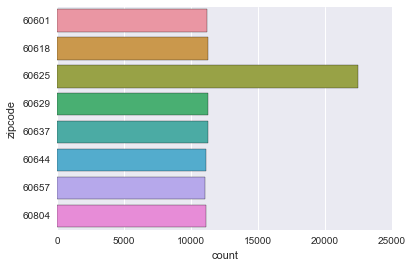

In [94]:
# Are ZIP codes equally represented?
data.zipcode.value_counts(normalize=True)
_ = sns.countplot(y="zipcode", data=data)

We only have data from 8 zip codes. The data looks equally distributed across zip codes, except for 60625 being responsible for 22% of the entries.

In [95]:
# How is our target variable distributed by ZIP code?
cross_table = pd.crosstab(data.zipcode, data.SeriousDlqin2yrs)
cross_table["total"] = cross_table[0] + cross_table[1]
cross_table["perc_of_SeriousDlqin2yrs"] = cross_table[1] / cross_table["total"]
cross_table

SeriousDlqin2yrs,0,1,total,perc_of_SeriousDlqin2yrs
zipcode,,,,
60601,10424,737,11161,0.066034
60618,10530,747,11277,0.066241
60625,20969,1509,22478,0.067132
60629,10502,727,11229,0.064743
60637,10469,758,11227,0.067516
60644,10294,771,11065,0.069679
60657,10250,748,10998,0.068012
60804,10289,776,11065,0.070131


While the ZIP code 60625 has the most entries in the dataset, the relative rate of individuals experiencing 90 days past due delinquency or worse is relatively stable across all ZIP codes.

In [96]:
# What is the mean of a variable for target = 1 and target = 0?
data.groupby("SeriousDlqin2yrs").mean()

,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
SeriousDlqin2yrs,,,,,,,,,,,
0,5.574359,52.747415,60648.569164,0.284262,353.424513,6716.737005,8.497786,0.136684,1.020656,0.128159,0.746169
1,3.865456,45.839067,60649.594124,2.534475,299.046113,5581.459851,7.899601,2.250997,0.988336,1.975639,0.936673


On average, individuals experiencing 90 days past due delinquency or worse ...
    - are younger (45.8 vs 52.75)
    - have a lower income (5581 vs 6716)
    - have a lower debt ratio (299 vs 353). However, these means are likely influenced by outliers or come from cases without monthly income/ with no reported income. Therefore, this comparison only holds if we assume that no income/no reported income shows same distribution across target variable.
    - have a lower amount of open credit lines and loans (7.89 vs 8.5)
    - have more dependents (0.94 vs 0.75)
    - have been more often 30-59/60-89/90 days past due but no worse in the last 2 years.

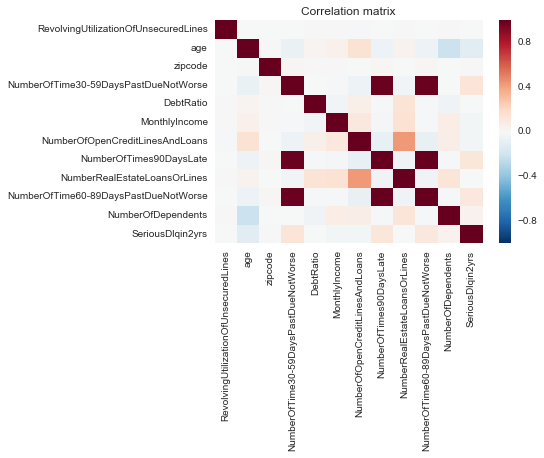

In [97]:
# How are the variables correlated with each other?
exploration.plot_correlations(data, 'Correlation matrix')

_Answer:_ 

There is a __moderate__ positive correlation between our target variable _SeriousDlqin2yrs_ and:
    - NumberOfTime30-59DaysPastDueNotWorse
    - NumberOfTime60-89DaysPastDueNotWorse
    - NumberOfTime90DaysLate
    
There is a __small__ positive correlation between our target variable _SeriousDlqin2yrs_ and:
    - NumberOfDependents
   
There is a __small__ negative correlation between our target variable _SeriousDlqin2yrs_ and:
    - age

----
# Pre-Processing

In [98]:
data.head()

,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs
PersonID,,,,,,,,,,,,
87936,0.000000,68,60804,0,798.000000,NaN,4,0,1,0,0.0,0
3893,1.000000,34,60644,0,0.058946,4325.0,2,0,0,0,0.0,0
41405,1.000666,39,60637,0,1911.000000,NaN,5,0,2,0,0.0,0
91125,0.653085,52,60629,0,0.203020,4900.0,10,0,0,0,2.0,0
67373,1.000000,54,60625,3,779.000000,NaN,5,2,1,2,NaN,1


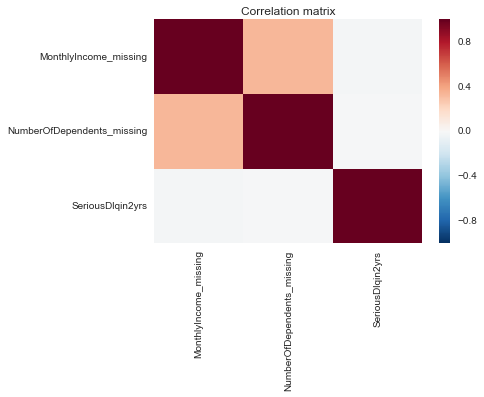

In [99]:
categorical_vars = ['zipcode']

new_columns = preprocess.keep_track_of_missing_values(data, "_missing")
data = preprocess.fill_missing_categorical_values(data, categorical_vars)
data = preprocess.fill_missing_values(data)

#Are the missing values correlated with our target?
exploration.plot_correlations(data[new_columns + ["SeriousDlqin2yrs"]], 'Correlation matrix')

There is no correlation between missing values and our target _SeriousDlqin2yrs_.

----
# Building Features

In [100]:
# setting test's zipcode as category with attributes from train to ensure 
# same columns in train and test set.
X_test["zipcode"] = X_test["zipcode"].astype('category', categories=X_train.zipcode.unique())

# We will use this code to identify discretized dummy vars
dummy_code = "_XX_disc"

# modifying variables
data = preprocess.dummify_var(data, categorical_vars)
data = preprocess.discretize_cont_var(data, "age", 10, dummy_code)

----
# Preprocessing Test Set

In [101]:
#We will use the preprocessed data as training data
X_train = data.drop(["SeriousDlqin2yrs"], axis=1)

In [102]:
# Do we have similar % of target in train and test?
y_train.value_counts(normalize=True)
y_test.value_counts(normalize=True)

0    0.932607
1    0.067393
Name: SeriousDlqin2yrs, dtype: float64

0    0.934283
1    0.065717
Name: SeriousDlqin2yrs, dtype: float64

In [103]:
#keeping track of missing values (but only in same columns as train data)
preprocess.create_missing_value_colum_in_testset(X_train, X_test, "_missing")

#fill empty values
X_test = preprocess.fill_missing_categorical_values(X_test, categorical_vars)
X_test = preprocess.fill_missing_values(X_test)

# ensuring that X_test has the same columns as X_train
X_test = preprocess.dummify_var(X_test, categorical_vars)
col_to_value_dict = preprocess.build_col_to_value_dict(X_train, dummy_code)
X_test = preprocess.insert_discretize_quantiles(X_test, col_to_value_dict)

In [104]:
# creating train and "test/val" set for finding best model. We will report
# performance eventually on X_test.
X_train_val, X_test_val, y_train_val, y_test_val = train_test_split(X_train, y_train, 
                                                                    test_size=0.3, random_state=0)

In [105]:
# We will use models that perform better with scaled data, so let's scale non-binary columns.

non_binary_columns = ['RevolvingUtilizationOfUnsecuredLines', 'age',
       'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
       'NumberOfDependents']

# If your data contains many outliers, scaling using the mean and variance of the data is 
# likely to not work very well. In these cases, you can use robust_scale and RobustScaler as 
# drop-in replacements instead. They use more robust estimates for the center and range of your data.
scaler = preprocessing.RobustScaler().fit(X_train_val[non_binary_columns])

# Important: we only fit the scaler on X_train_val and then use the "learned" transformation on
# the other data sets.
X_train_val.loc[:,non_binary_columns] = scaler.transform(X_train_val[non_binary_columns])
X_test_val.loc[:,non_binary_columns] = scaler.transform(X_test_val[non_binary_columns]) 

/Users/hannes/anaconda/lib/python3.5/site-packages/pandas/core/indexing.py:477: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [42]:
# A look at our training data
X_train_val.head(3)

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,...,"age_XX_disc_[21, 33]","age_XX_disc_(33, 39]","age_XX_disc_(39, 44]","age_XX_disc_(44, 48]","age_XX_disc_(48, 52]","age_XX_disc_(52, 56]","age_XX_disc_(56, 61]","age_XX_disc_(61, 65]","age_XX_disc_(65, 72]","age_XX_disc_(72, 109]"
PersonID,,,,,,,,,,,,,,,,,,,,,
45080,-0.228477,-0.045455,0.0,-0.048854,1.605913,0.000000,0.0,0.5,0.0,1.0,...,0,0,0,0,1,0,0,0,0,0
10640,-0.169345,-0.909091,0.0,-0.132327,-0.274110,-0.333333,0.0,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,0,0
46234,0.851301,-0.136364,0.0,0.038487,-0.882893,-0.666667,0.0,0.0,0.0,1.0,...,0,0,0,0,1,0,0,0,0,0


----
# Training Simple Classifiers

In [43]:
# It is unlikely that an individual is delinquent. 
# How well can we predict if we randomly predict 
# according to mean of training data?

# Let's train some easy classifiers
easy_cls_dict = {'AvgPred': (predictions.Average_Predictor(), None),
                 'RandomPred': (predictions.Average_Predictor(), np.array([0,1])),
                 'ZeroPred': (predictions.Zero_Predictor(), None),
                }

for cls_name, cls_tuple in easy_cls_dict.items():
    print("Fitting ", cls_name)
    cls, target = cls_tuple
    if (target is not None):
        cls.fit(target)
    else:
        cls.fit(y_train_val)
    
    acc_score = cls.score(X_test_val, y_test_val, 'accuracy')
    prec_score = cls.score(X_test_val, y_test_val, 'precision')
    print(cls_name, "achieves scores of:")
    print("\tacc_score: {}\n\tprec_score: {}\n".format(acc_score, prec_score))

Fitting  ZeroPred
ZeroPred achieves scores of:
	acc_score: 0.9342951907131012
	prec_score: 0

Fitting  RandomPred
RandomPred achieves scores of:
	acc_score: 0.5032172470978441
	prec_score: 0.06544485171609464

Fitting  AvgPred
AvgPred achieves scores of:
	acc_score: 0.8755887230514097
	prec_score: 0.06424717999019126



__Average Predictor__: When we only predict that an individual is delinquent according to the probability of delinquency (predict delinquency when random number is less than mean of y_train_val), we achieve an accuracy of 0.87 on our hold-out set from the training data. Using the same approach we achieve a precision of 0.062 -> of all the cases where our algorithm says that the individual will face financial problems, only 6% of the individuals actually face financial problems.

__Random Predictor__: When we only predict that an individual is delinquent according to chance, we achieve an accuracy of 0.5 on our hold-out set from the training data. Using the same approach we achieve a precision of 0.065 -> of all the cases where our algorithm says that the individual will face financial problems, only 6.5% of the individuals actually face financial problems.

__Zero Predictor__: When we always predict that an individual is not delinquent, we achieve an accuracy of 0.93 on our hold-out set from the training data. However, we also never predict that an individual faces financial problems, which is not useful for this application.

----
# Training ML models

In [22]:
# Training models on train, finding best on validation; re-training best on combined train and validation; reporting performance
# on fresh test set

RF


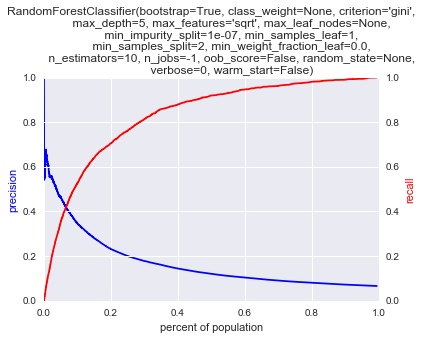

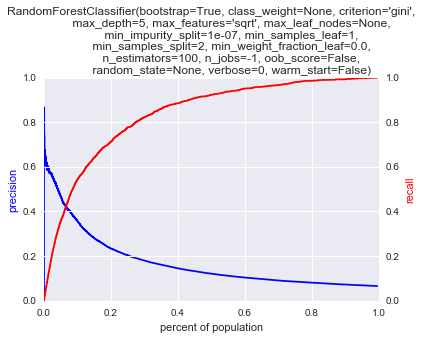

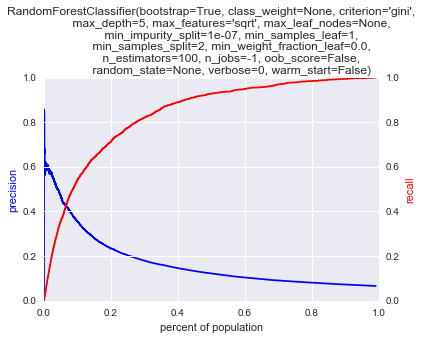

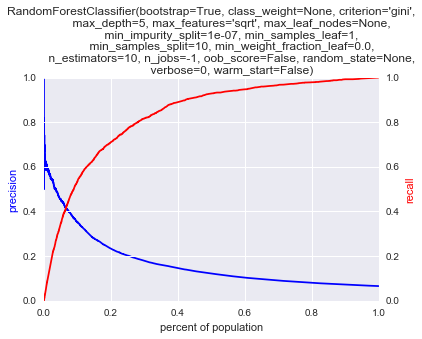

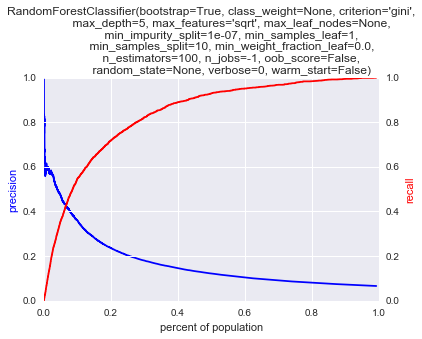

...

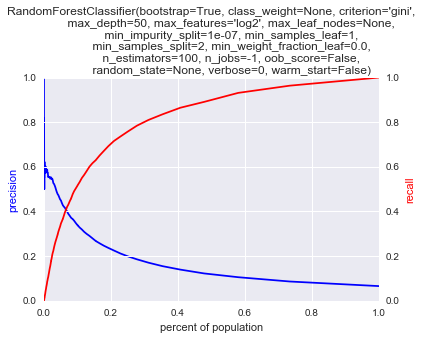

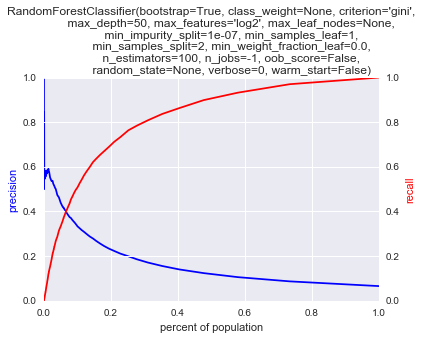

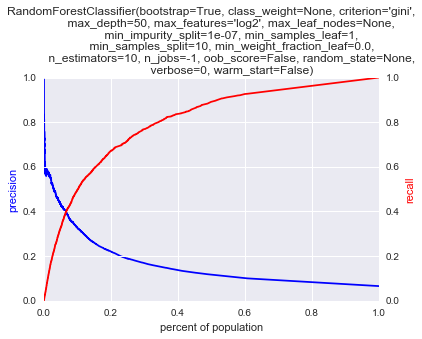

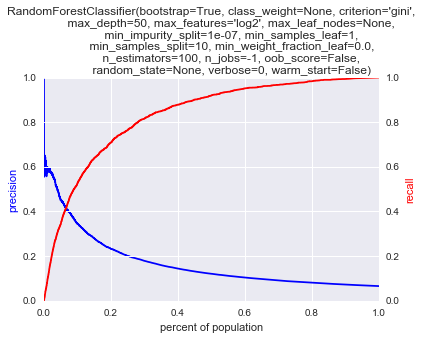

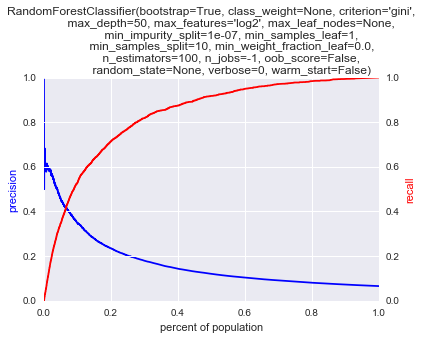

DT


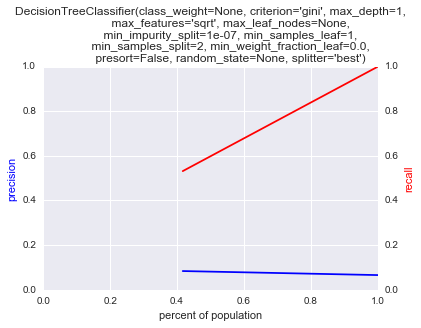

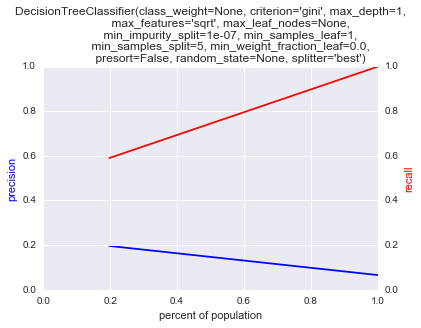

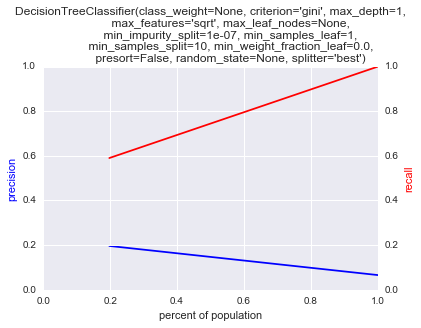

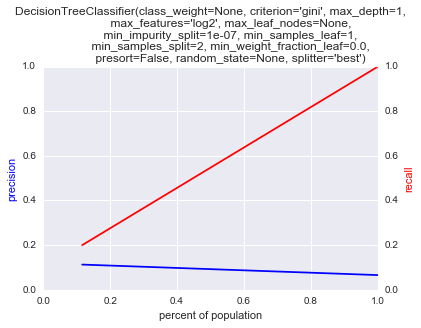

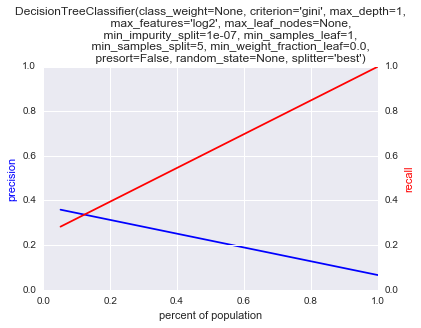

...

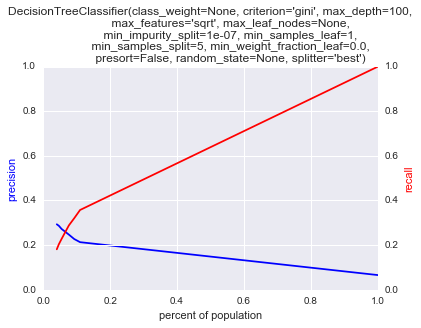

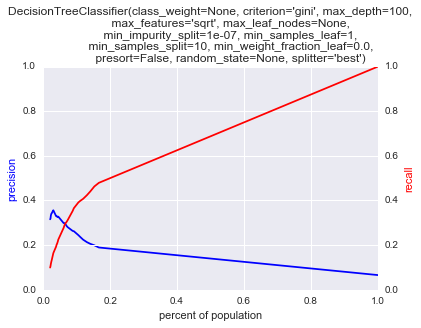

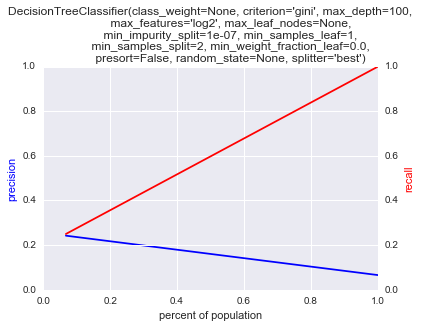

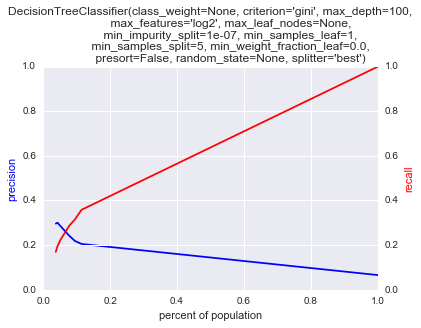

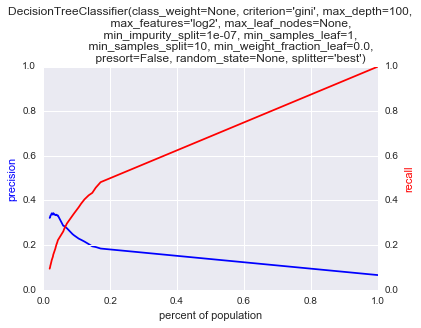

KNN


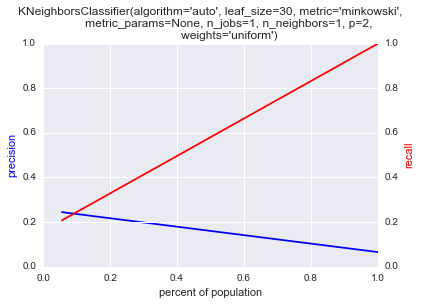

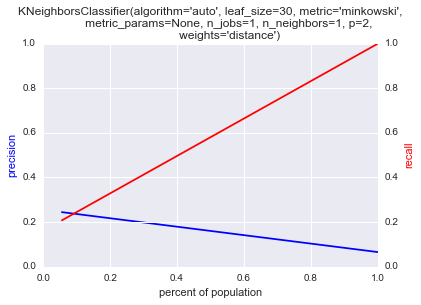

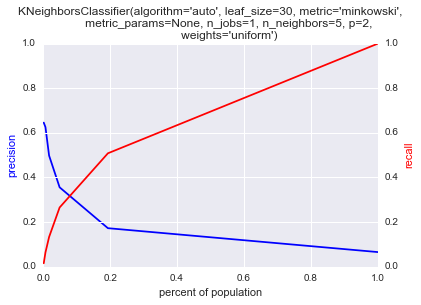

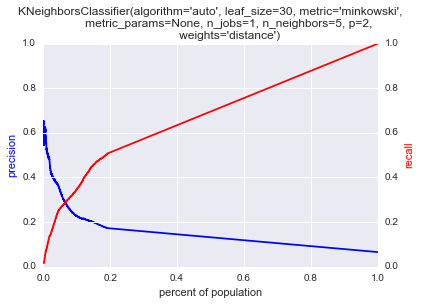

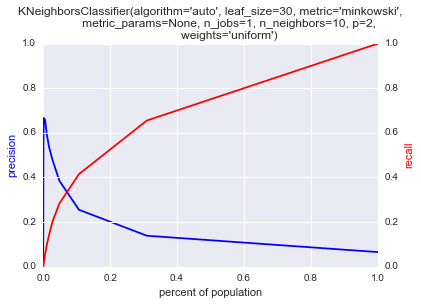

...

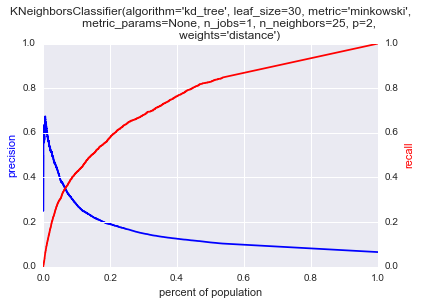

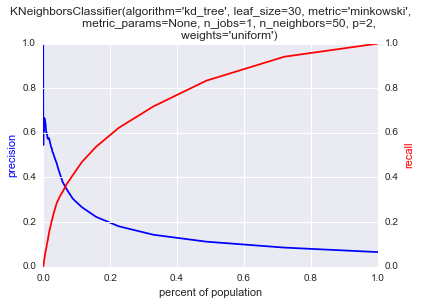

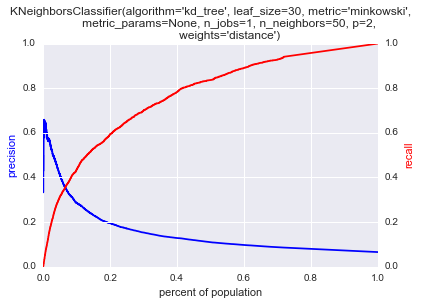

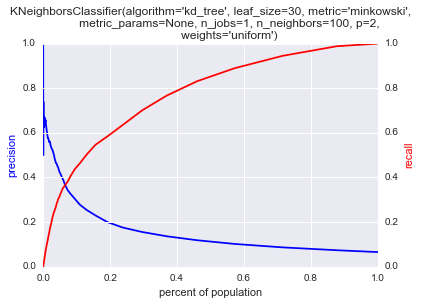

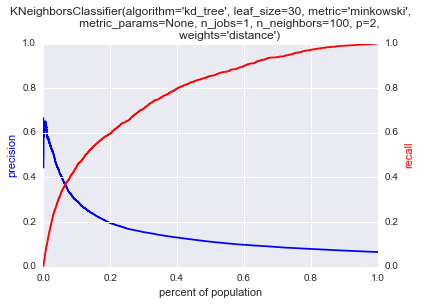

AB


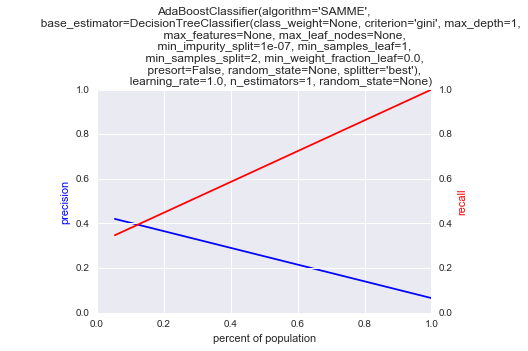

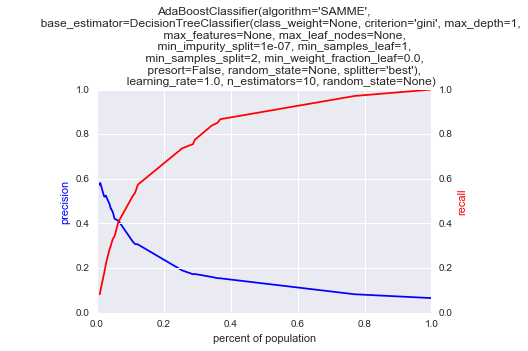

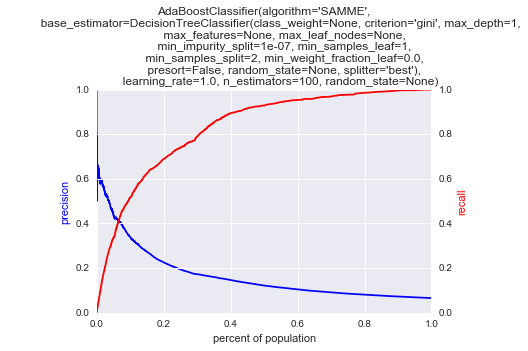

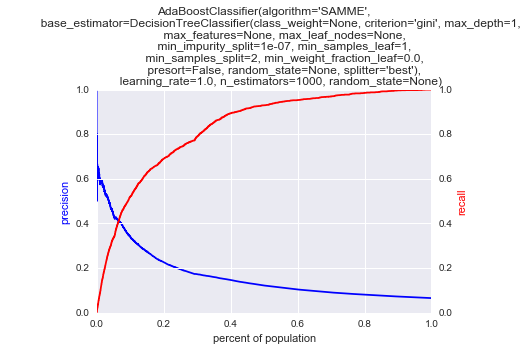

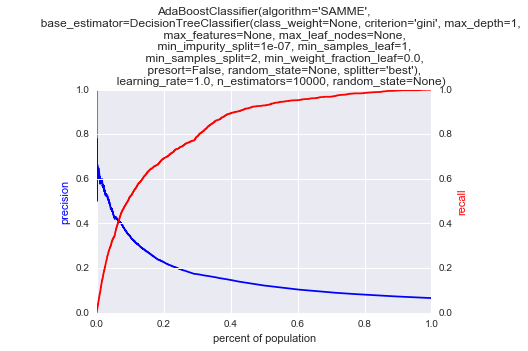

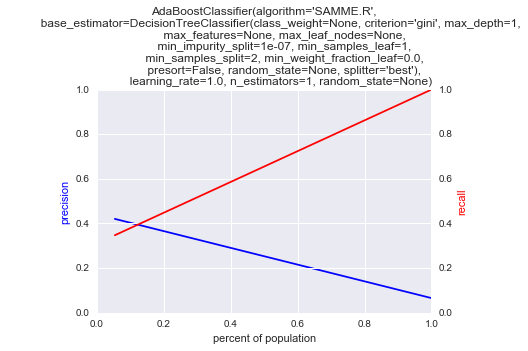

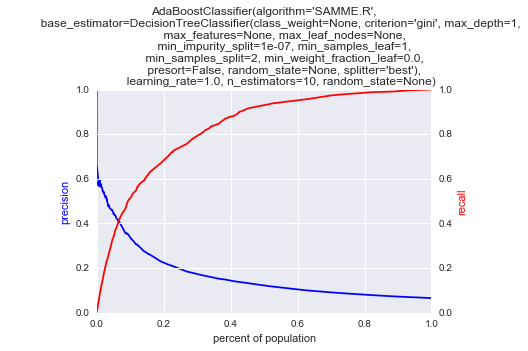

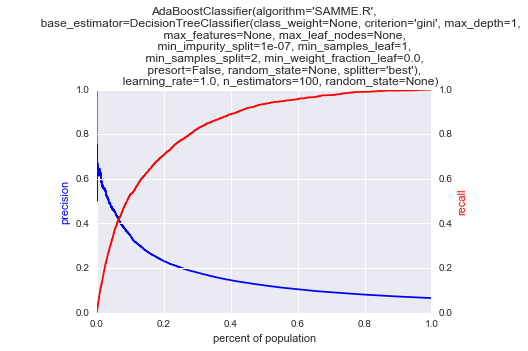

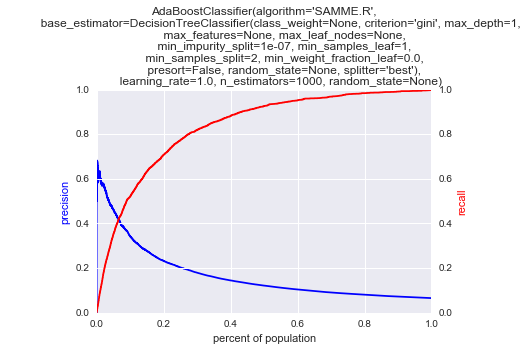

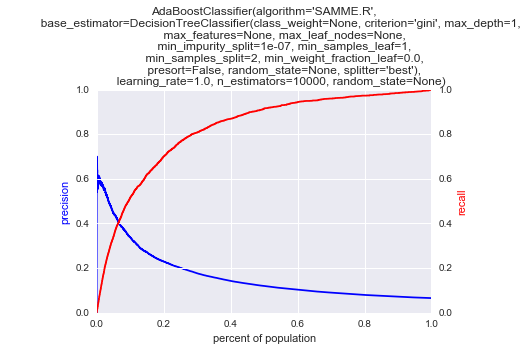

GB


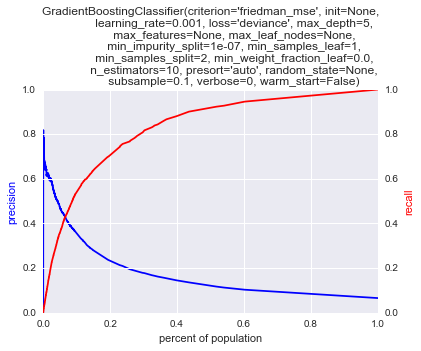

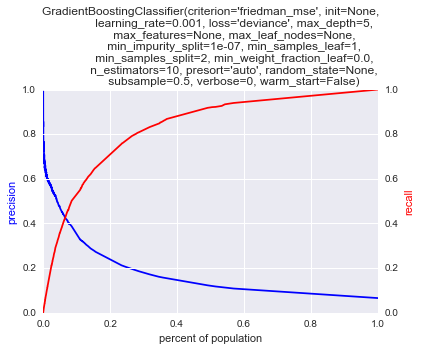

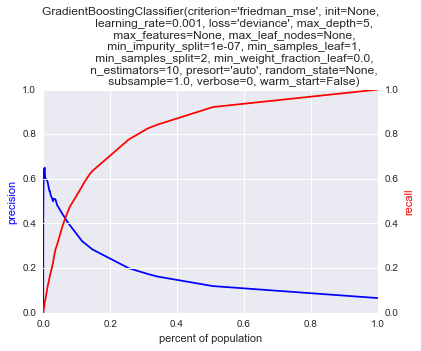

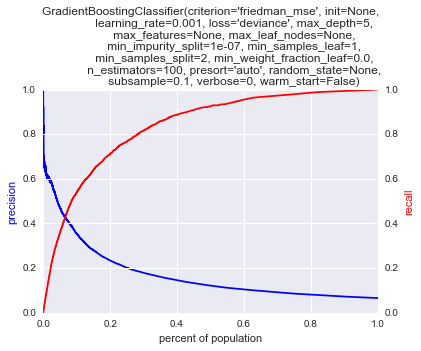

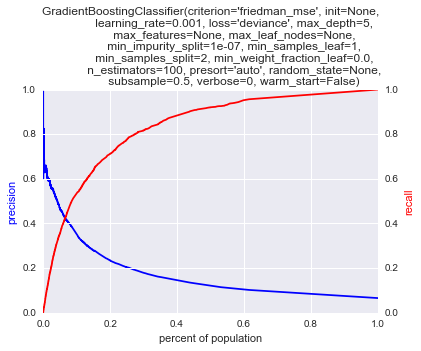

...

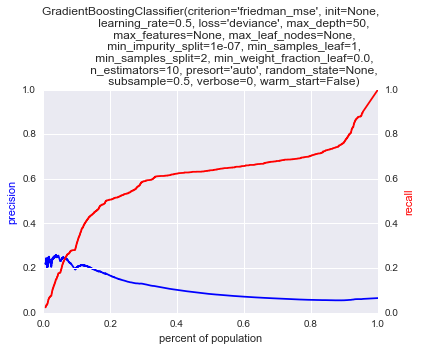

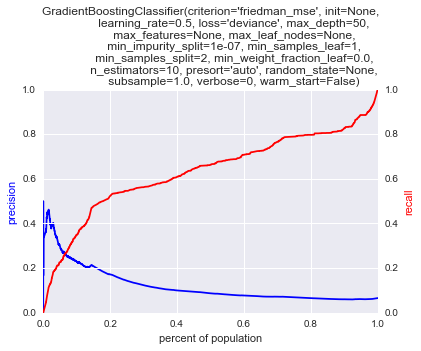

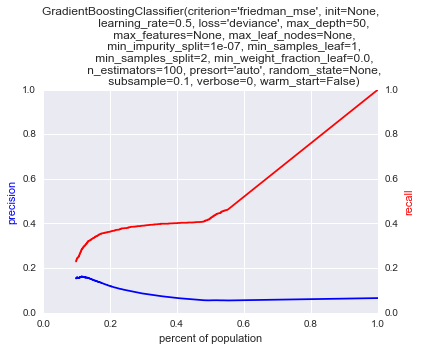

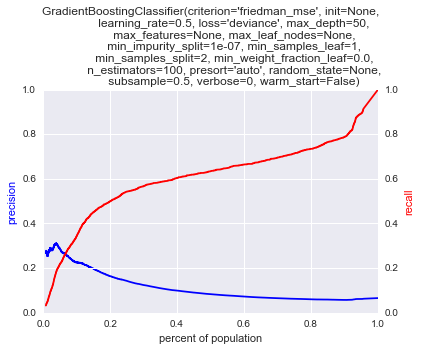

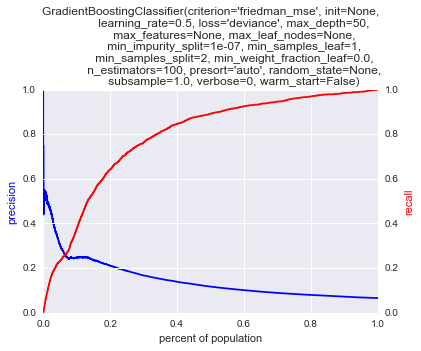

LR


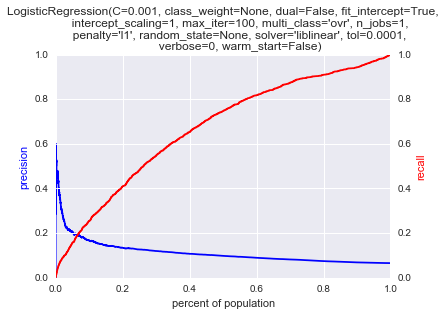

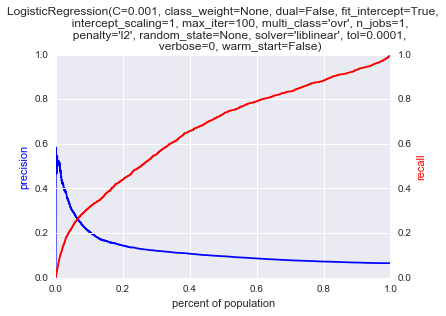

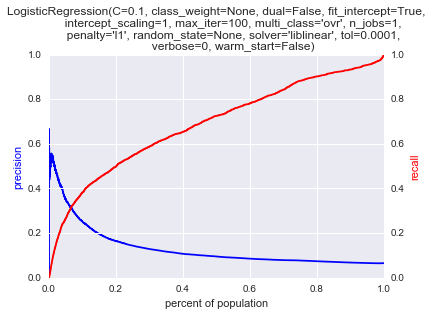

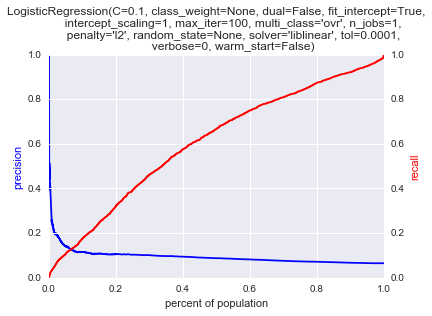

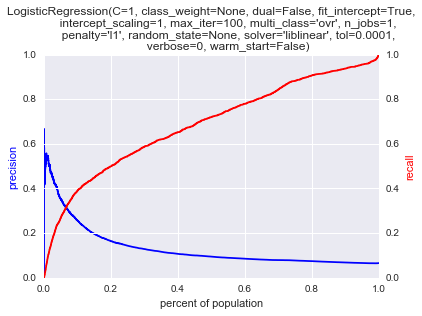

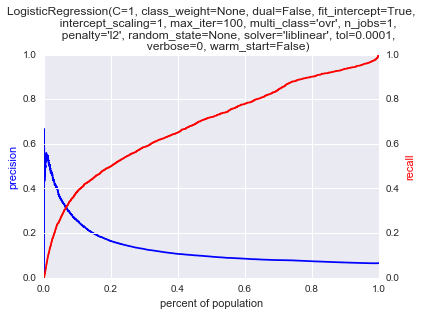

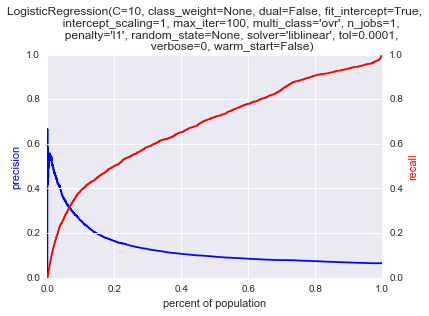

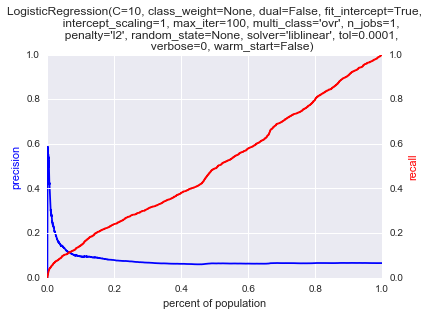

NB


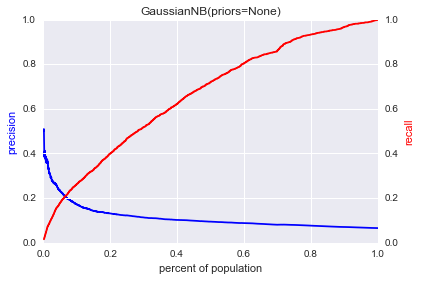

NN


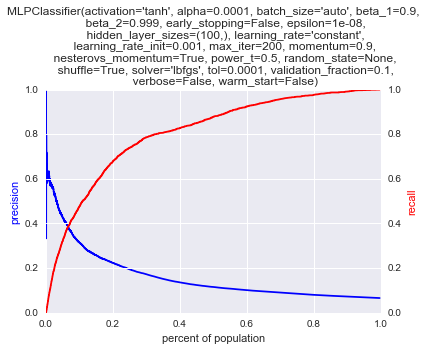

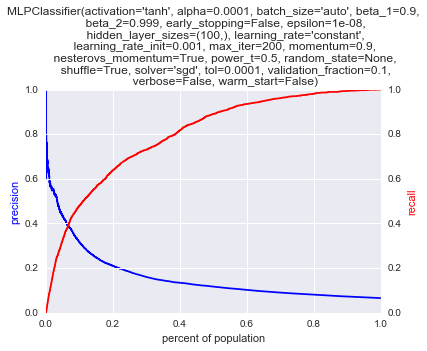

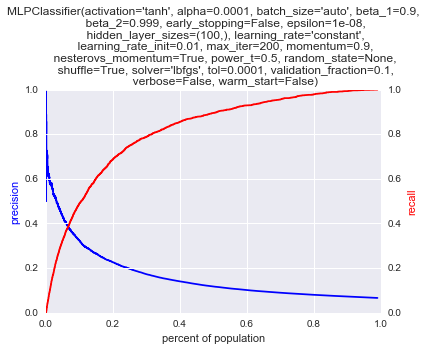

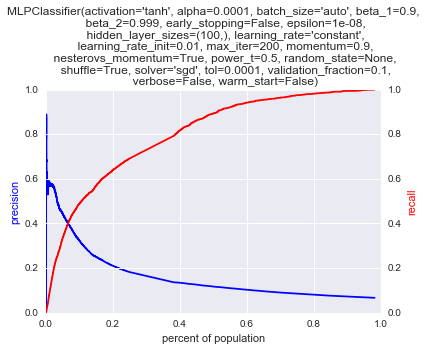

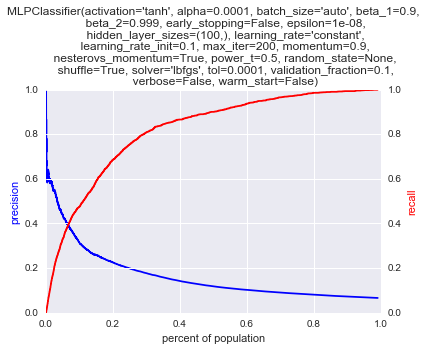

...

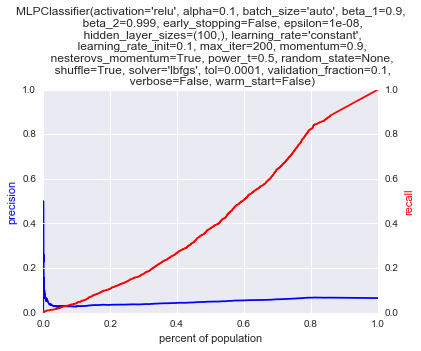

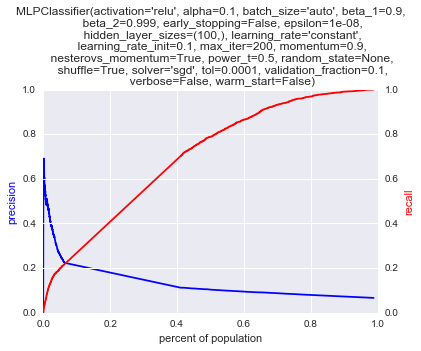

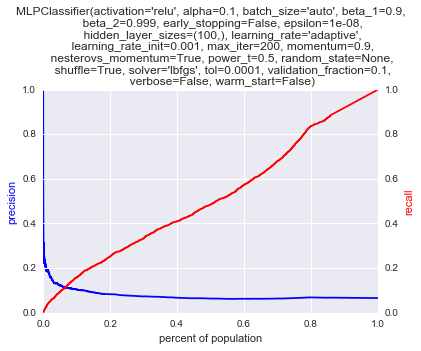

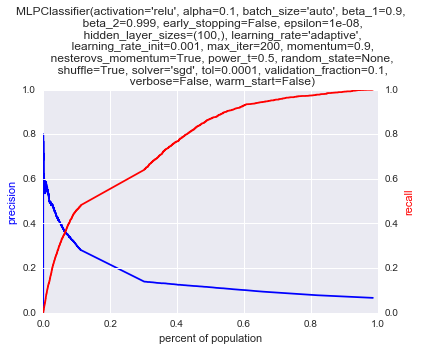

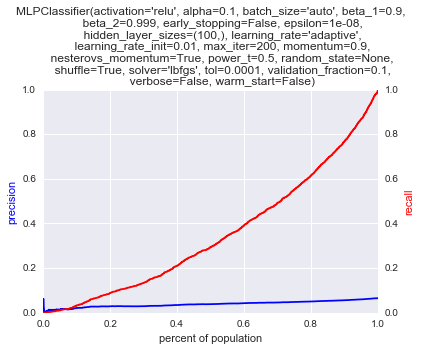

/Users/hannes/anaconda/lib/python3.5/site-packages/sklearn/neural_network/multilayer_perceptron.py:563: ConvergenceWarning: Stochastic Optimizer: Maximum iterations reached and the optimization hasn't converged yet.
  % (), ConvergenceWarning)


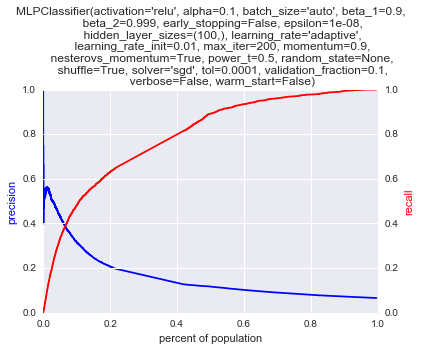

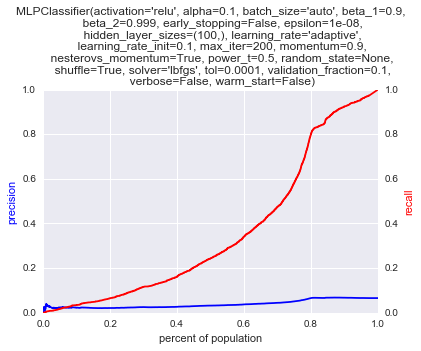

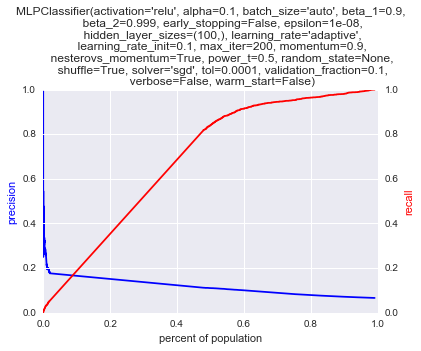

,model_type,clf,parameters,train_time,predict_time,threshold,auc-roc,p_at_1,p_at_20,p_at_50,...,rec_at_20,rec_at_50,rec_at_100,rec_at_150,rec_at_200,rec_at_500,rec_at_1000,rec_at_2000,rec_at_5000,rec_at_All
0,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 2, 'n_estimators': 10, '...",0.251668,0.118888,0.10,0.854524,1.0,0.6,0.6,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,0.895849,0.599192
1,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 2, 'n_estimators': 10, '...",0.251668,0.118888,0.15,0.854524,1.0,0.6,0.6,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,0.698113,0.466936
2,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 2, 'n_estimators': 10, '...",0.251668,0.118888,0.20,0.854524,1.0,0.6,0.6,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,0.642264,0.429581
3,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 2, 'n_estimators': 10, '...",0.251668,0.118888,0.25,0.854524,1.0,0.6,0.6,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.930622,0.587170,0.392731
4,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'min_samples_split': 2, 'n_estimators': 10, '...",0.251668,0.118888,0.30,0.854524,1.0,0.6,0.6,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.744019,0.469434,0.313983


In [23]:
start_time = time.time()

grid_size = 'small'
clfs, grid = predictions.define_clfs_params(grid_size)

models_to_run = ['RF', 'DT', 'KNN', 'AB', 'GB', 'LR', 'NB', 'NN']
list_ks = [1, 20, 50, 100, 150, 200, 500, 1000, 2000, 5000, "All"]
list_thresholds = np.arange(0.1, 1.05, 0.05)

results_df = predictions.clf_loop(models_to_run, clfs, grid, X_train_val, X_test_val, 
                                  y_train_val, y_test_val, list_ks, list_thresholds, print_plots = True)
results_df.head()
results_df.to_csv('results.csv', index=False)

took_time = time.time() - start_time

In [24]:
print("Done training on grid size: {}. It took {} min".format(grid_size, took_time / 60))

Done training on grid size: small. It took 236.0596128821373 min


----
# Training with Random Undersampling of Majority Class

In [44]:
# Using random undersampling of the majority class before training the classifiers.
rus = RandomUnderSampler(random_state=42)
X_train_undersample, y_train_undersample = rus.fit_sample(X_train_val, y_train_val)

print('Original dataset shape {}'.format(Counter(y_train_val)))
print('Resampled dataset shape {}'.format(Counter(y_train_undersample)))

Original dataset shape Counter({0: 65558, 1: 4792})
Resampled dataset shape Counter({0: 4792, 1: 4792})


RF


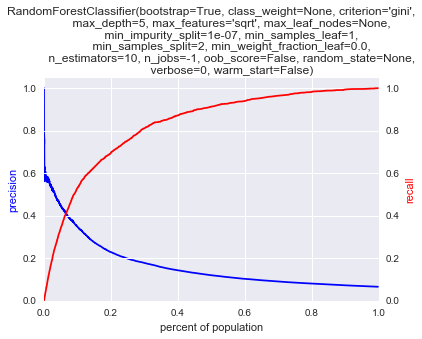

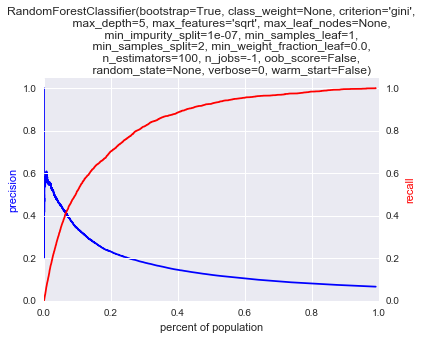

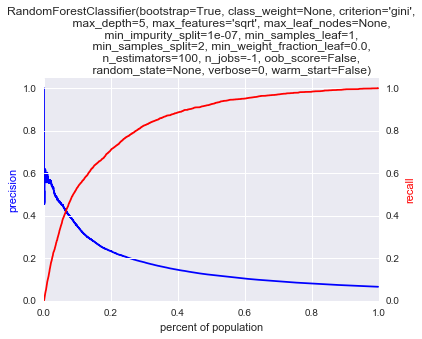

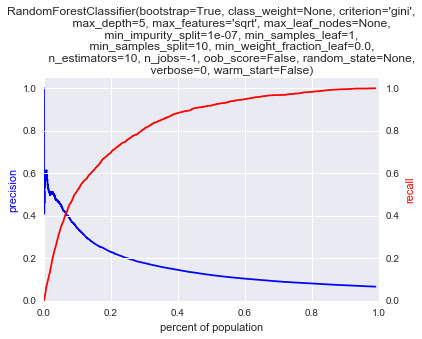

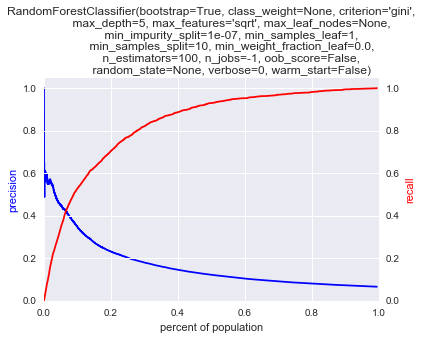

...

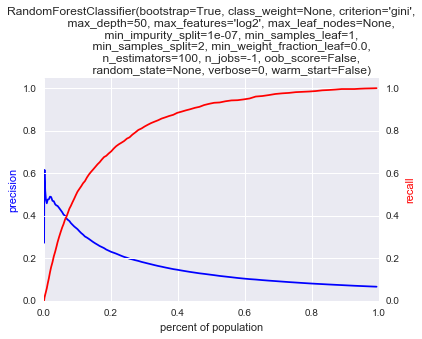

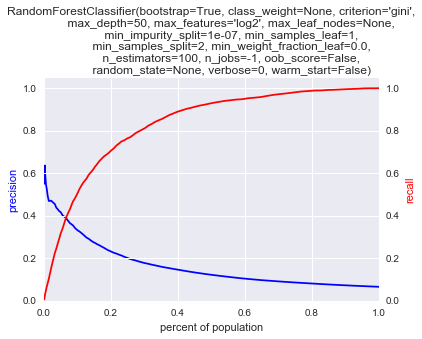

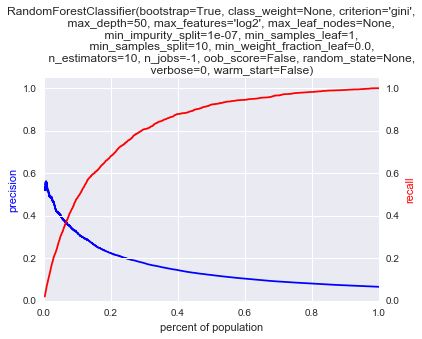

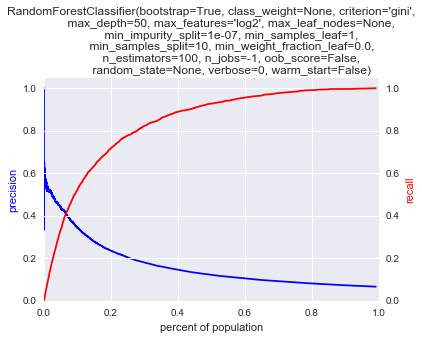

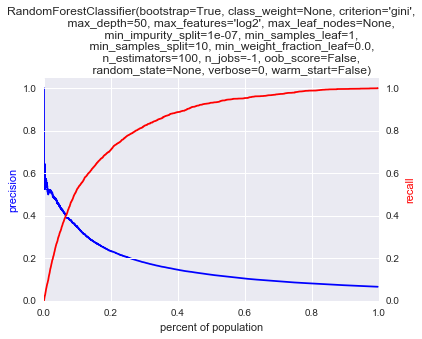

DT


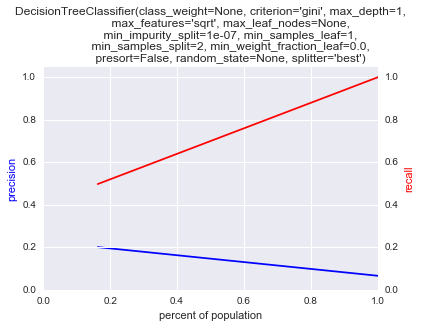

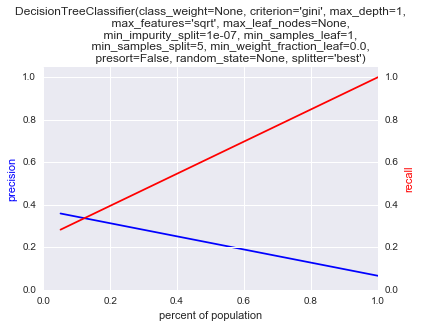

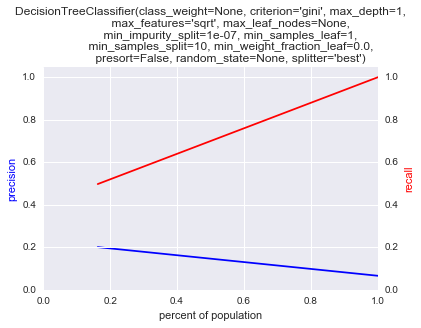

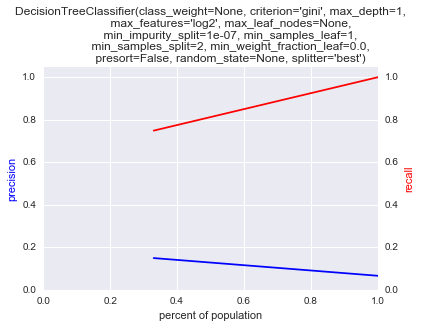

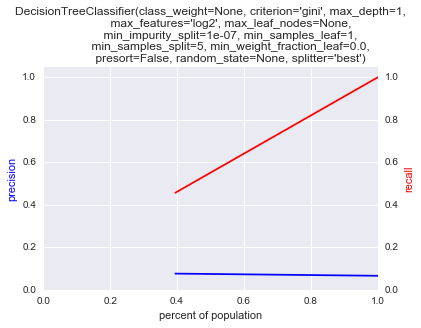

...

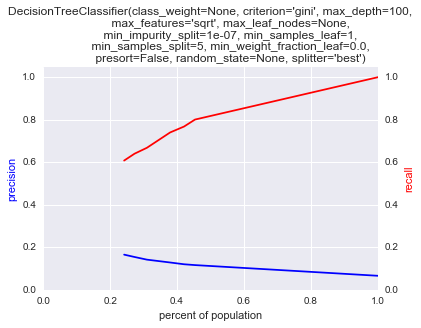

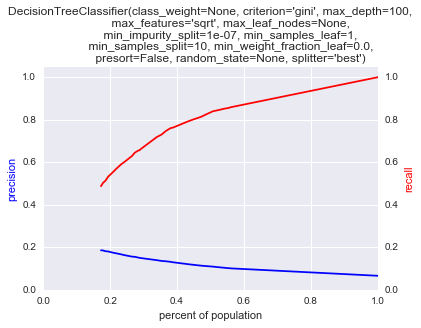

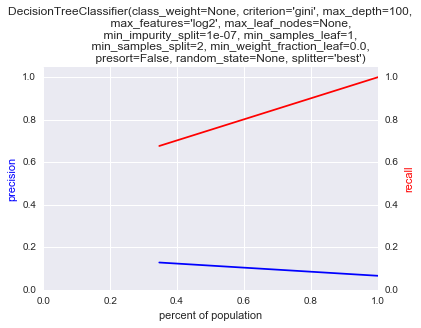

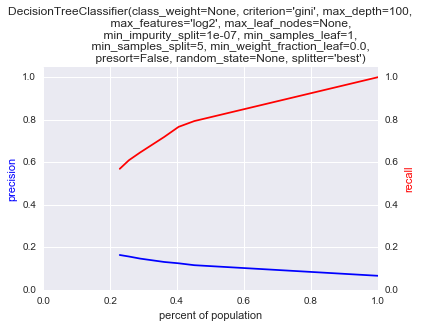

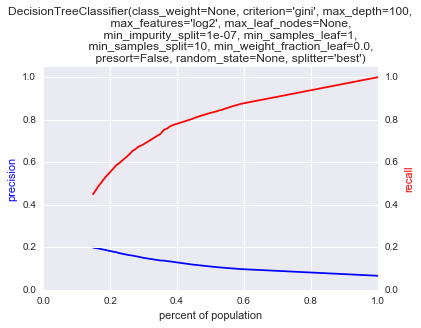

KNN


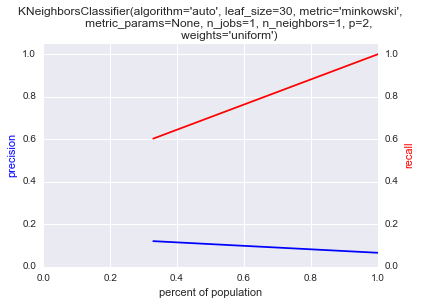

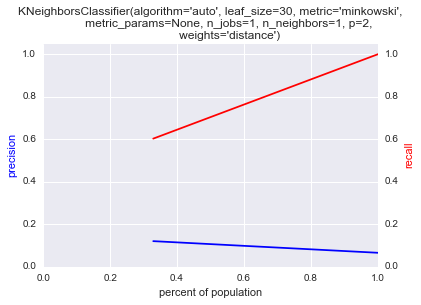

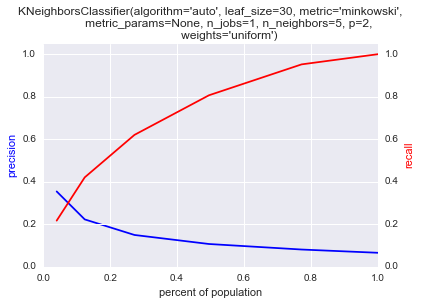

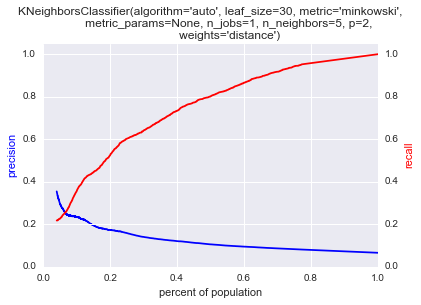

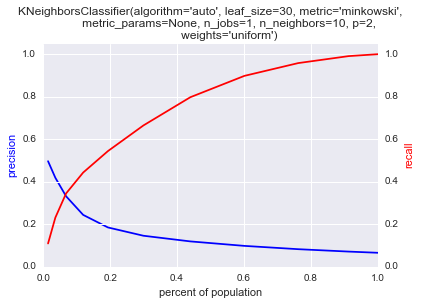

...

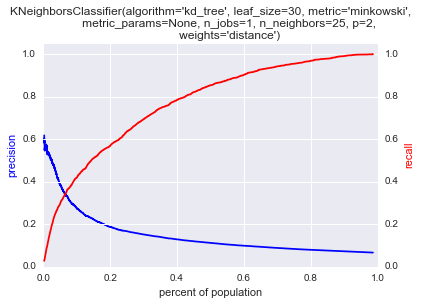

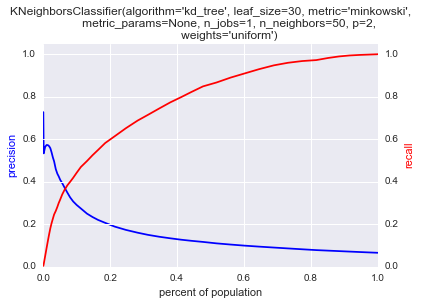

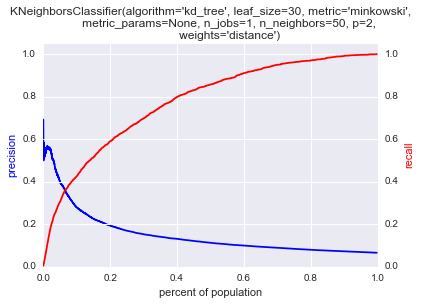

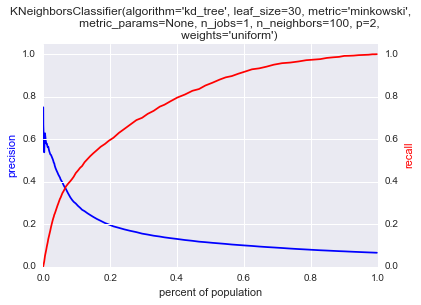

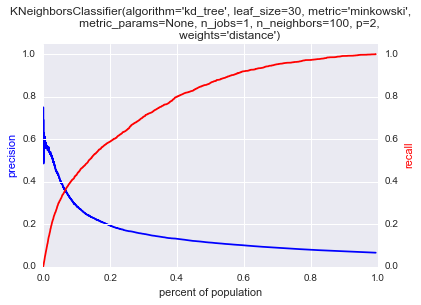

AB


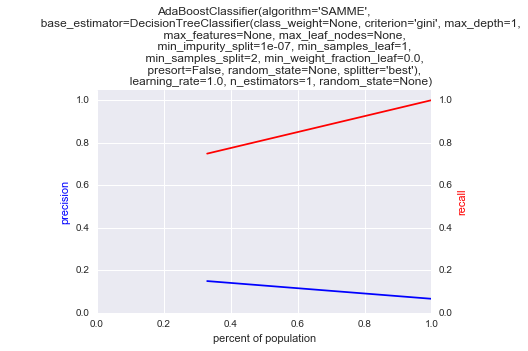

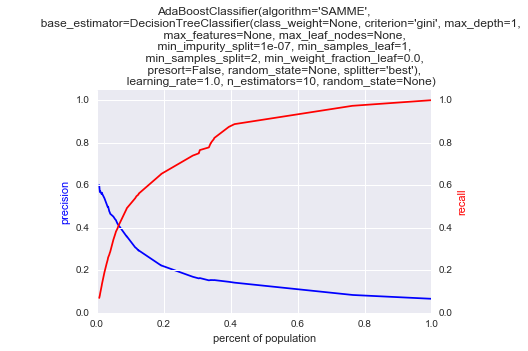

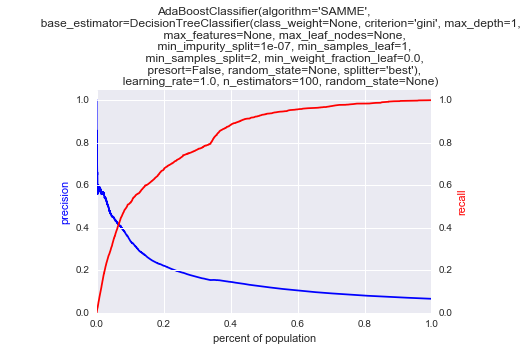

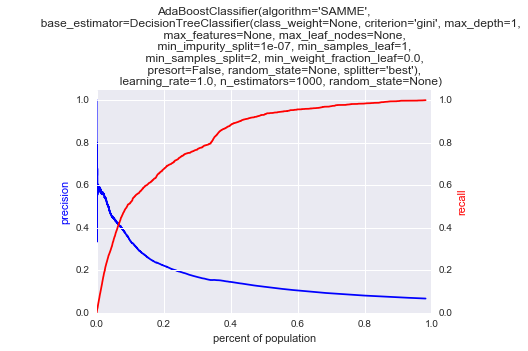

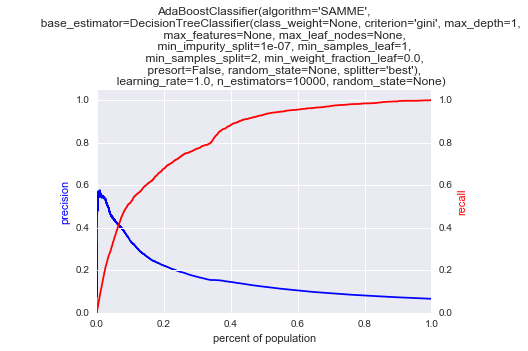

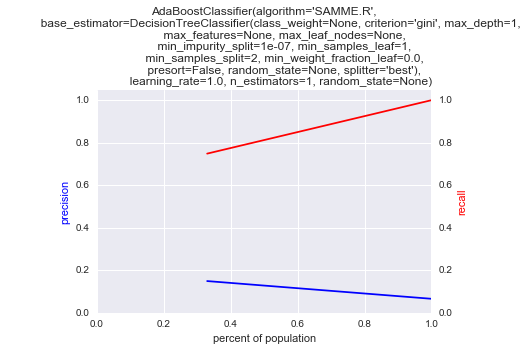

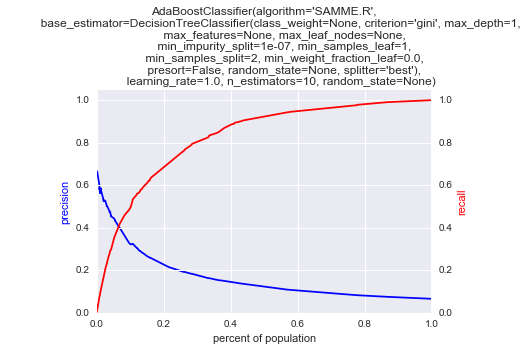

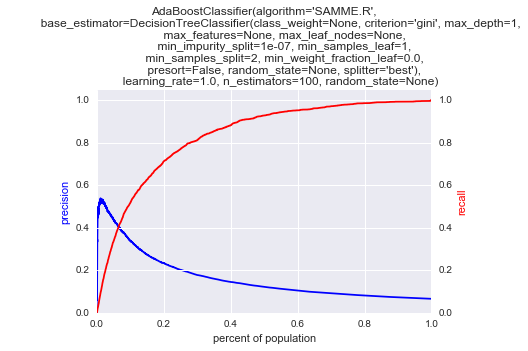

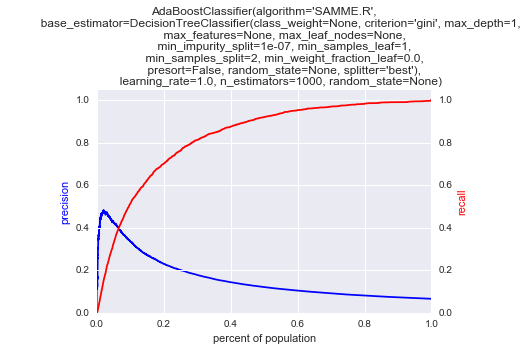

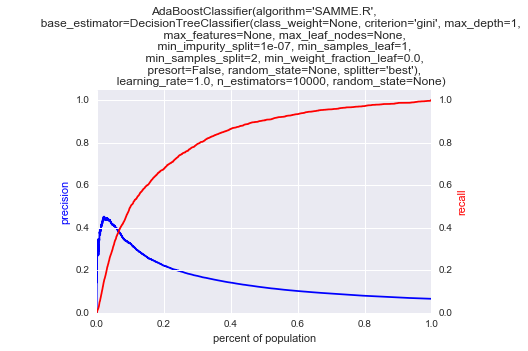

NN


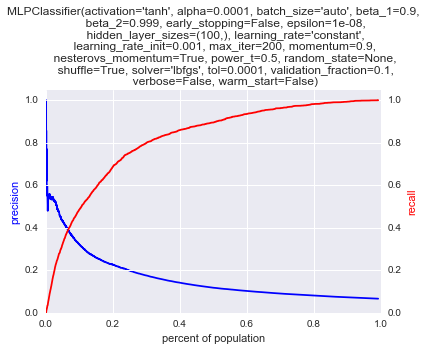

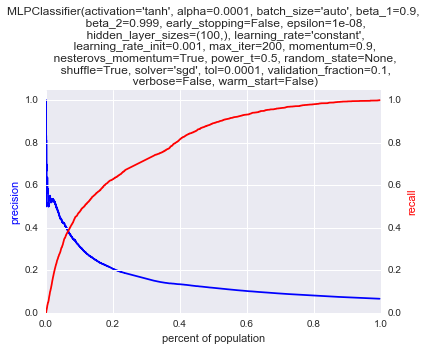

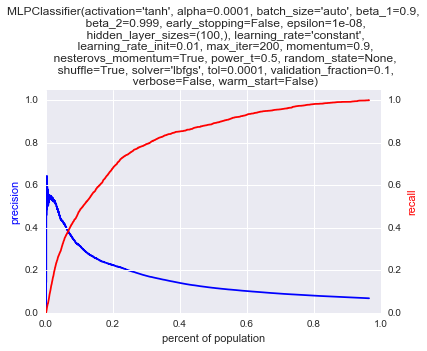

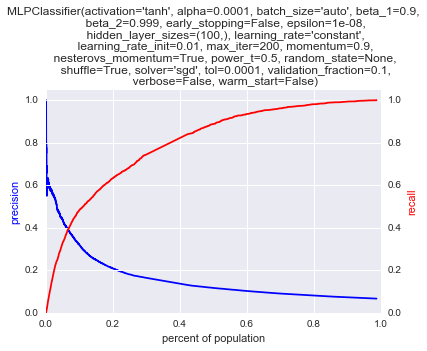

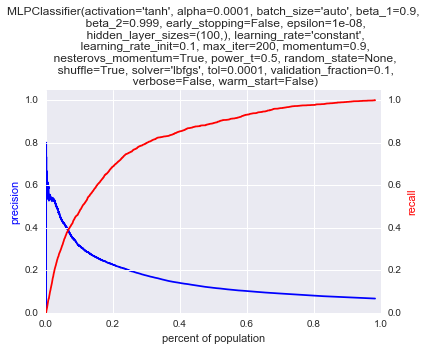

...

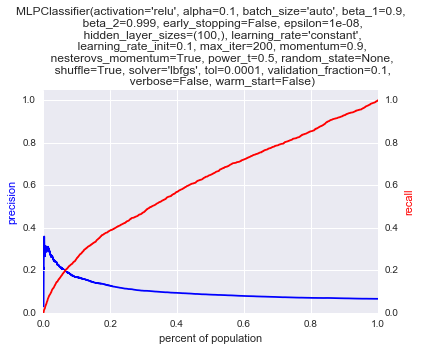

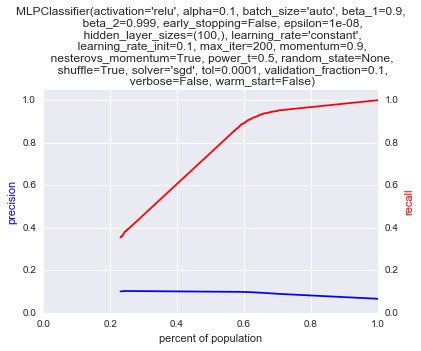

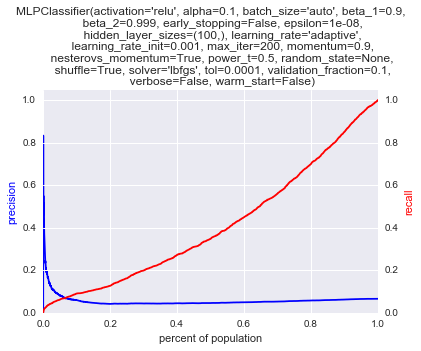

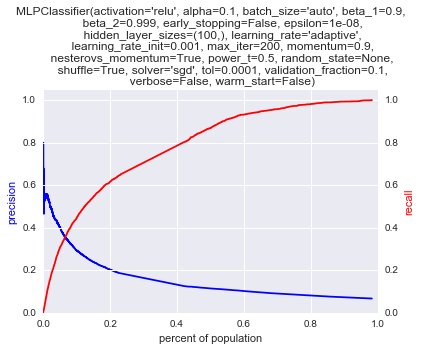

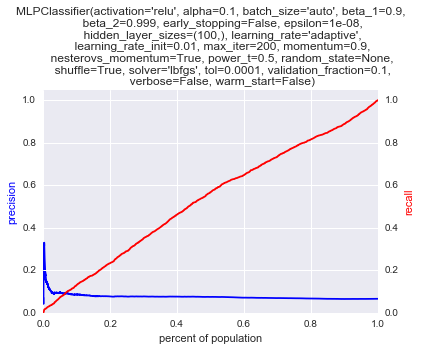

/Users/hannes/anaconda/lib/python3.5/site-packages/sklearn/neural_network/multilayer_perceptron.py:563: ConvergenceWarning: Stochastic Optimizer: Maximum iterations reached and the optimization hasn't converged yet.
  % (), ConvergenceWarning)


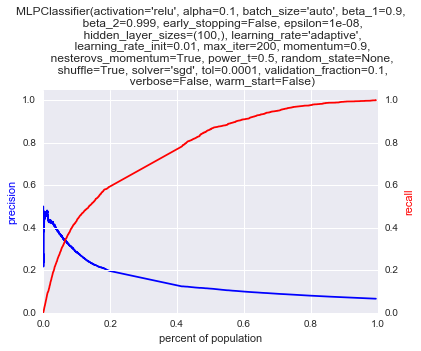

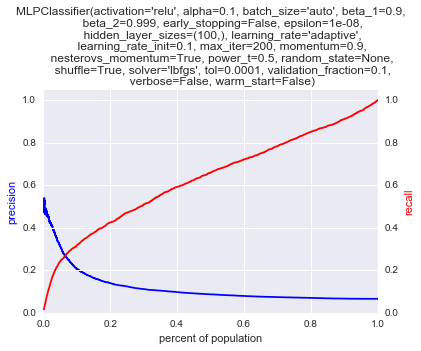

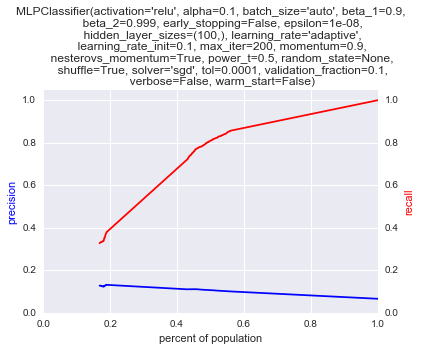

,model_type,clf,parameters,train_time,predict_time,threshold,auc-roc,p_at_1,p_at_20,p_at_50,...,rec_at_20,rec_at_50,rec_at_100,rec_at_150,rec_at_200,rec_at_500,rec_at_1000,rec_at_2000,rec_at_5000,rec_at_All
0,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_features': 'sqrt', 'max_depth': 5, 'min_...",0.115185,0.124574,0.10,0.850639,1.0,0.75,0.62,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000
1,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_features': 'sqrt', 'max_depth': 5, 'min_...",0.115185,0.124574,0.15,0.850639,1.0,0.75,0.62,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.998486
2,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_features': 'sqrt', 'max_depth': 5, 'min_...",0.115185,0.124574,0.20,0.850639,1.0,0.75,0.62,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.995962
3,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_features': 'sqrt', 'max_depth': 5, 'min_...",0.115185,0.124574,0.25,0.850639,1.0,0.75,0.62,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.985866
4,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_features': 'sqrt', 'max_depth': 5, 'min_...",0.115185,0.124574,0.30,0.850639,1.0,0.75,0.62,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.953559


In [47]:
# in the interest of time, we will only run a few models. 
models_to_run = ['RF', 'DT', 'KNN', 'AB', 'NN']

results_df_undersampling = predictions.clf_loop(models_to_run, clfs, grid, X_train_undersample, X_test_val, 
                                  y_train_undersample, y_test_val, list_ks, list_thresholds, print_plots = True)
results_df_undersampling.head()
results_df_undersampling.to_csv('results_undersampling.csv', index=False)

----
# Training with Random Oversampling of Minority Class

In [48]:
# Using random oversampling of the majority class before training the classifiers.
rus = RandomOverSampler(random_state=42)
X_train_oversample, y_train_oversample = rus.fit_sample(X_train_val, y_train_val)

print('Original dataset shape {}'.format(Counter(y_train_val)))
print('Resampled dataset shape {}'.format(Counter(y_train_oversample)))

Original dataset shape Counter({0: 65558, 1: 4792})
Resampled dataset shape Counter({0: 65558, 1: 65558})


RF


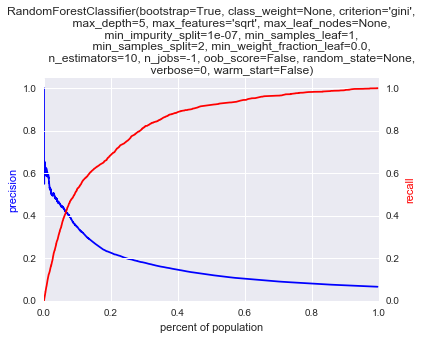

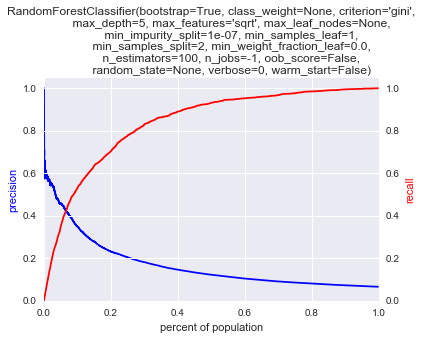

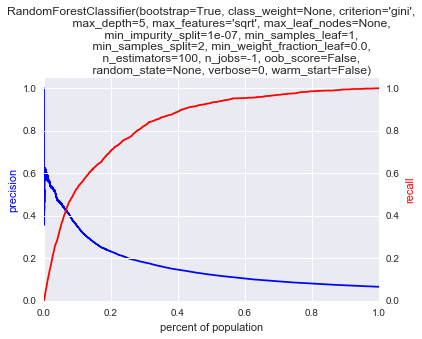

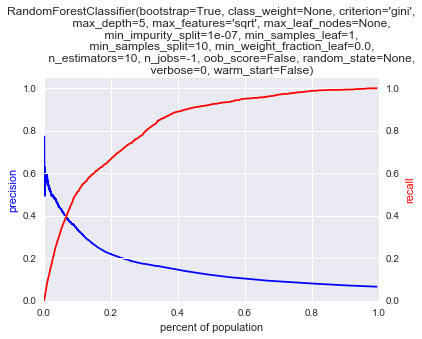

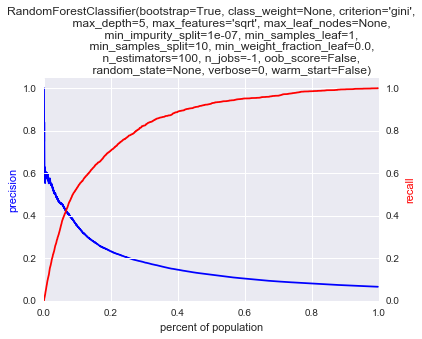

...

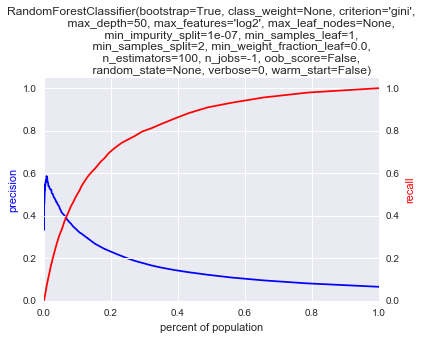

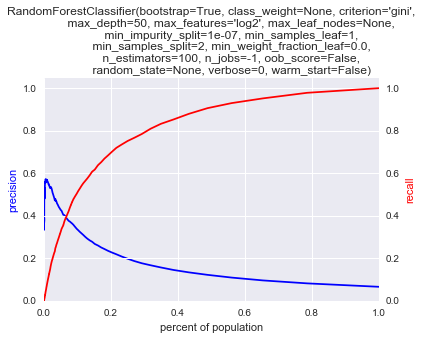

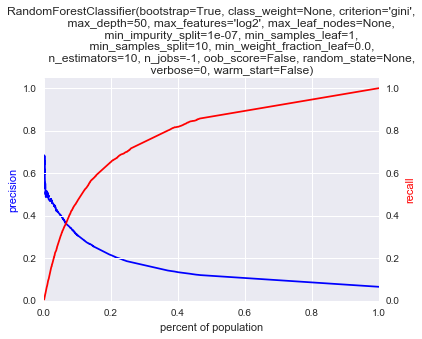

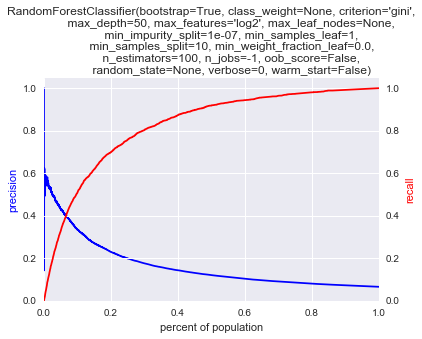

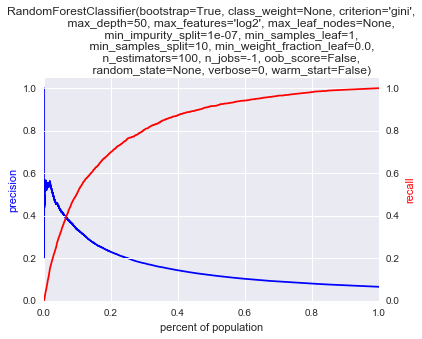

DT


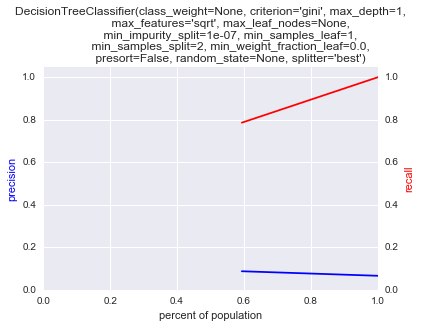

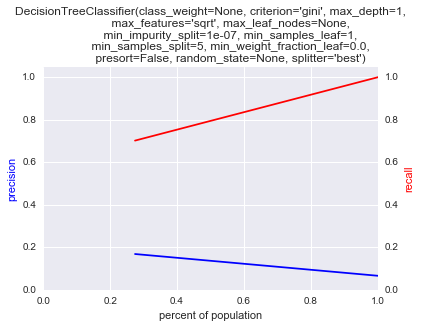

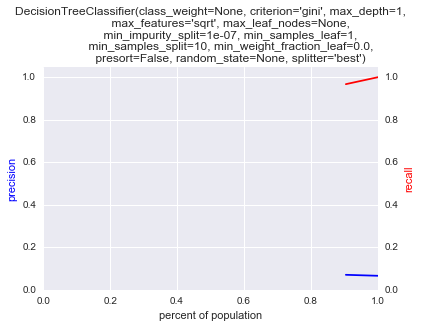

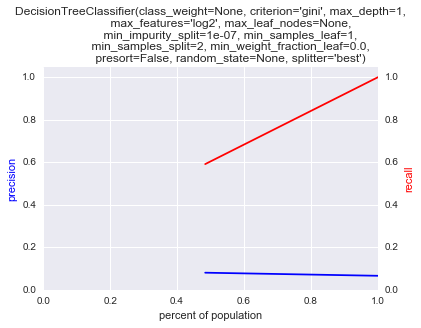

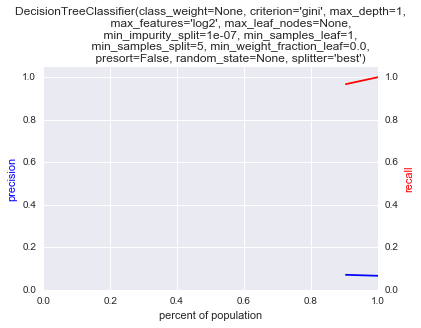

...

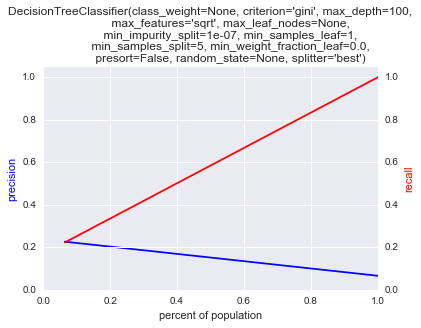

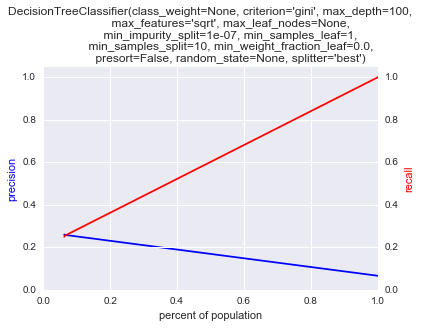

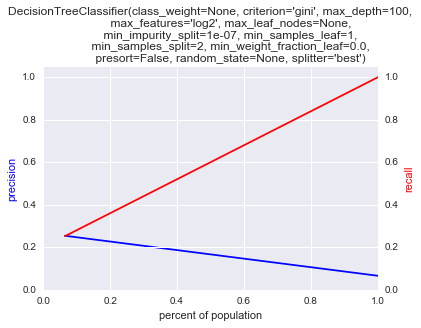

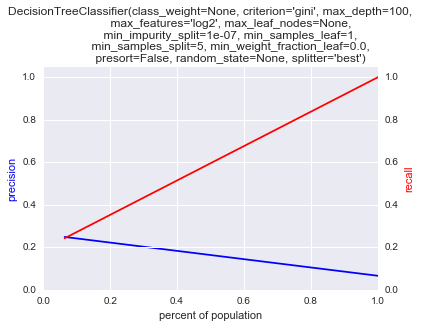

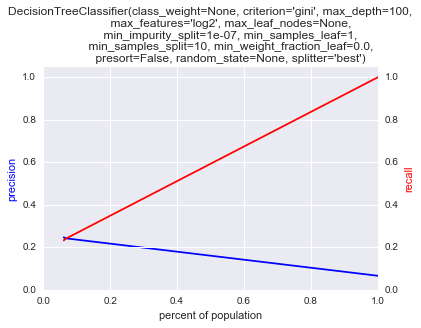

KNN


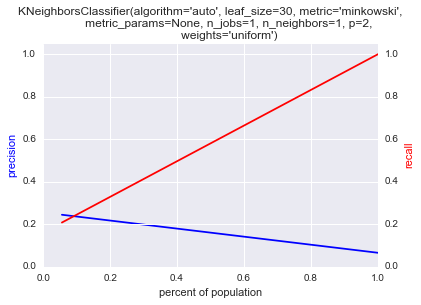

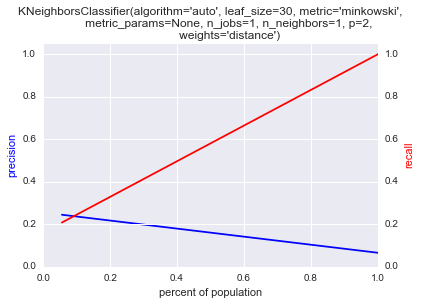

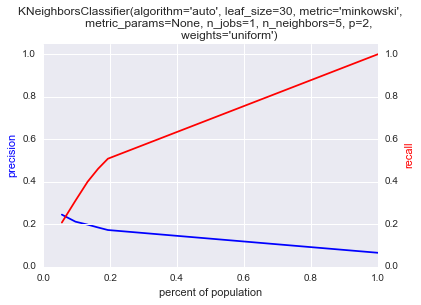

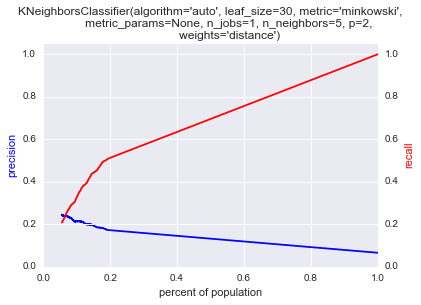

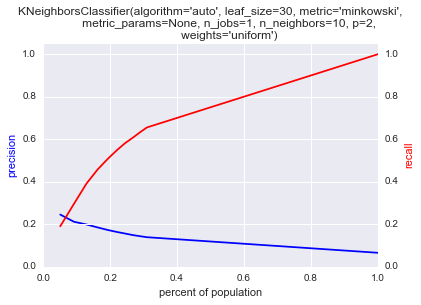

...

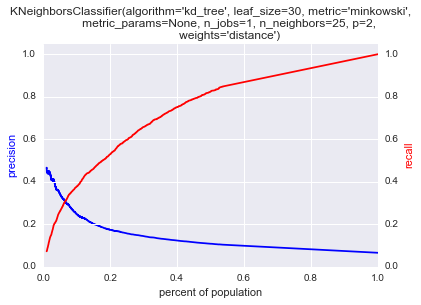

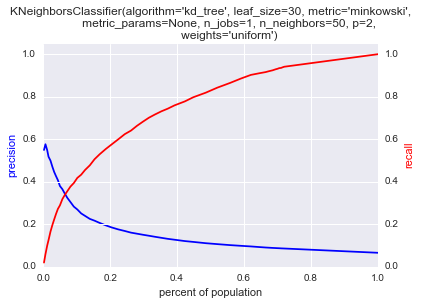

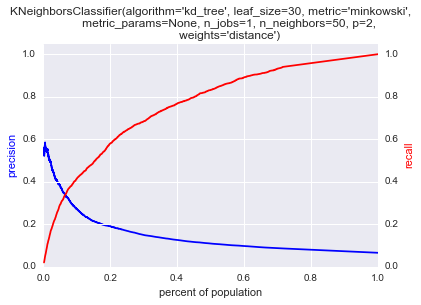

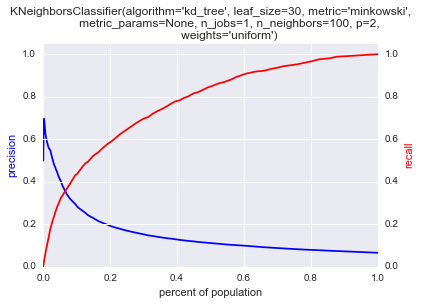

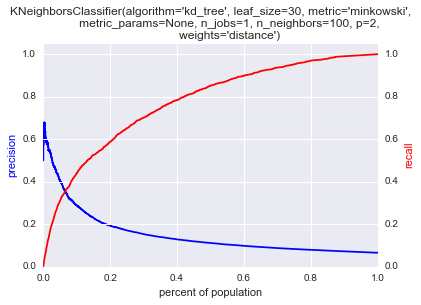

AB


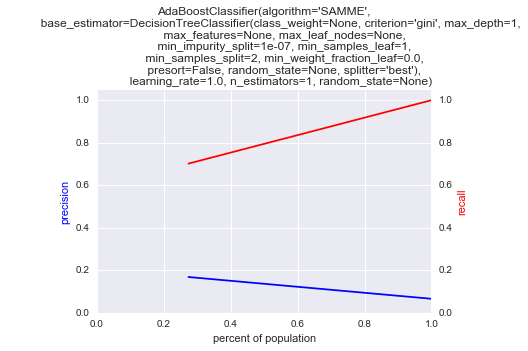

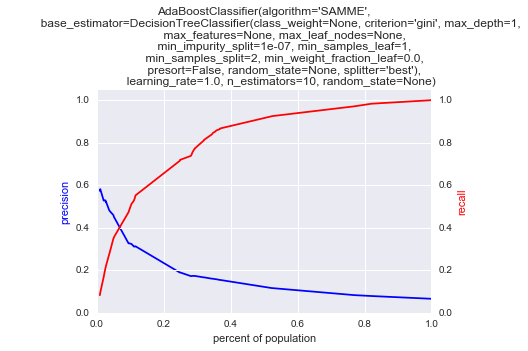

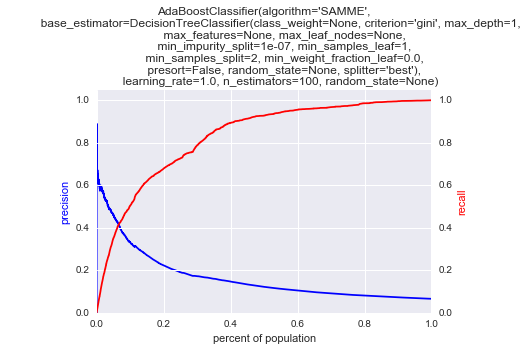

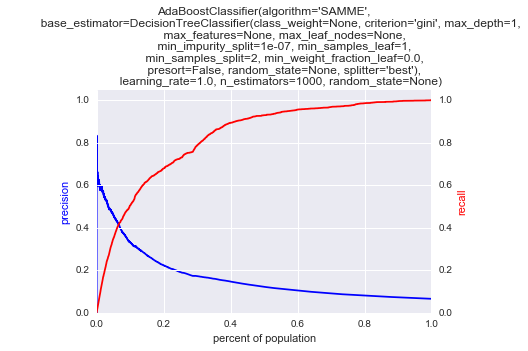

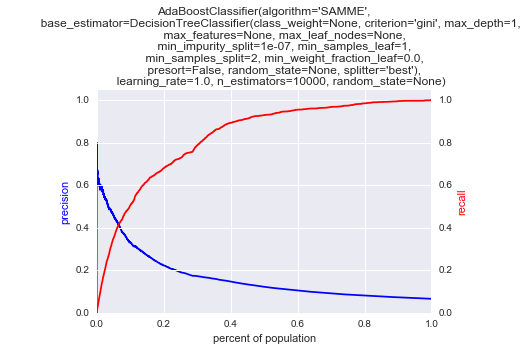

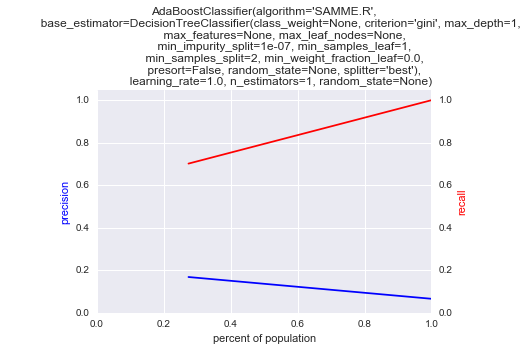

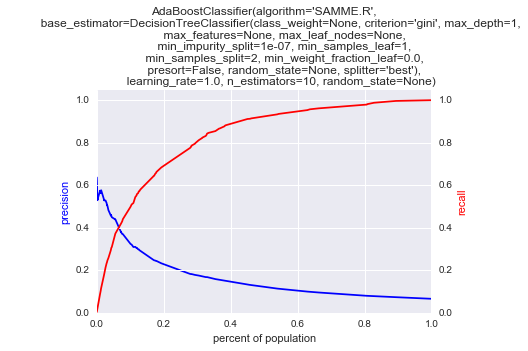

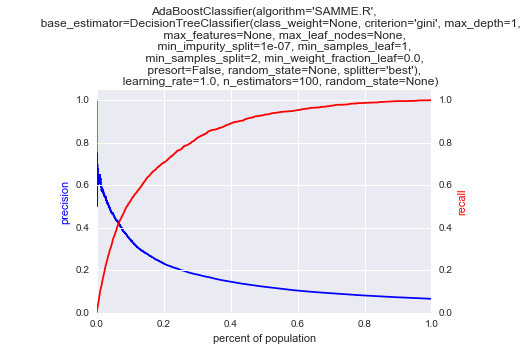

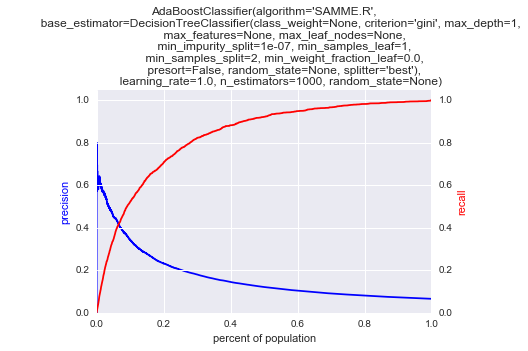

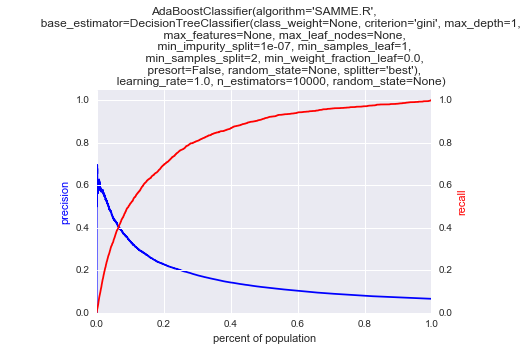

NN


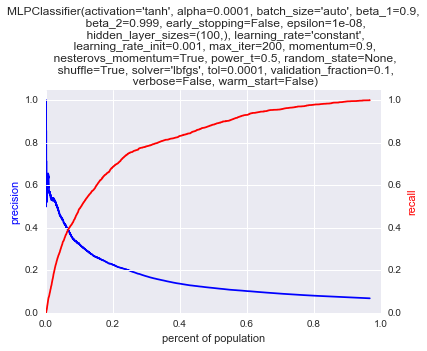

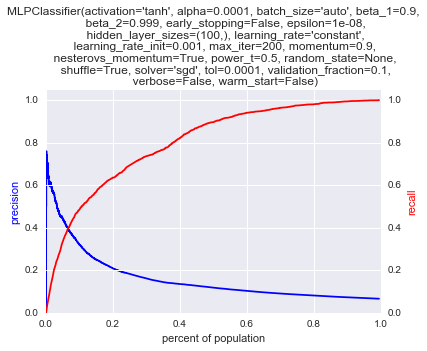

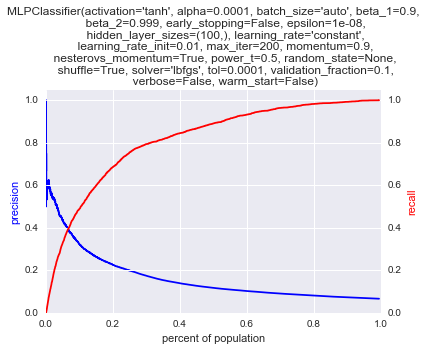

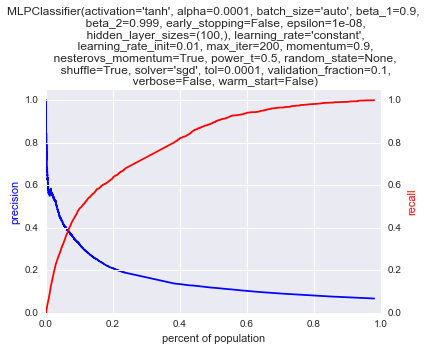

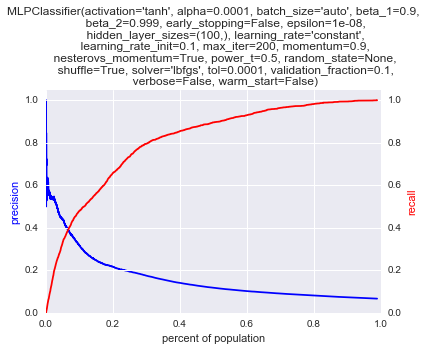

...

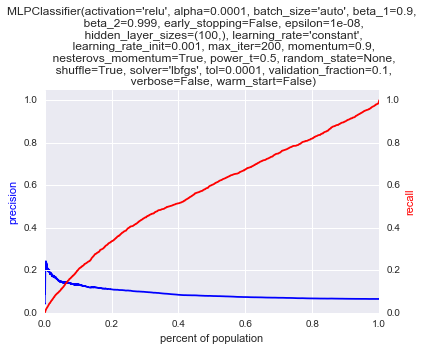

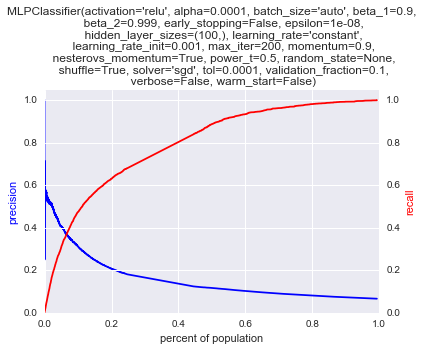

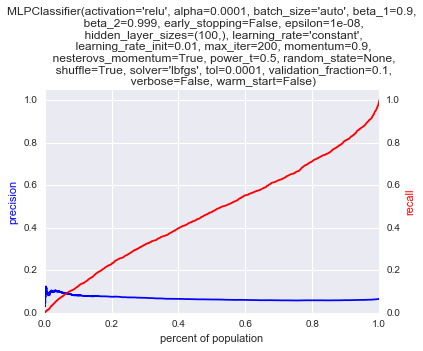

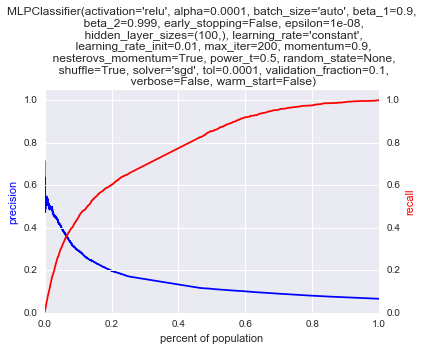

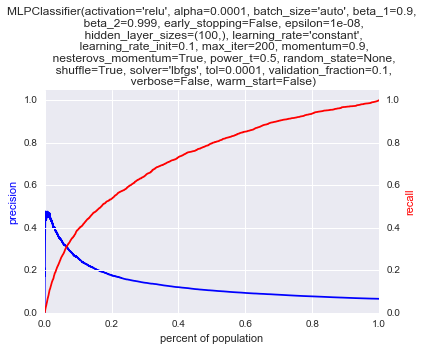

/Users/hannes/anaconda/lib/python3.5/site-packages/sklearn/neural_network/multilayer_perceptron.py:563: ConvergenceWarning: Stochastic Optimizer: Maximum iterations reached and the optimization hasn't converged yet.
  % (), ConvergenceWarning)


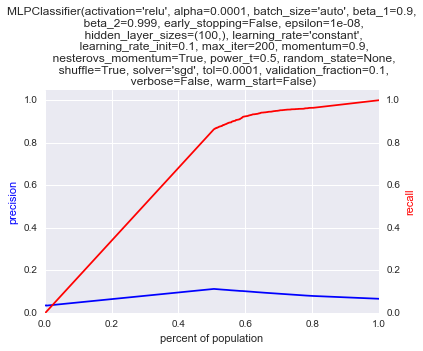

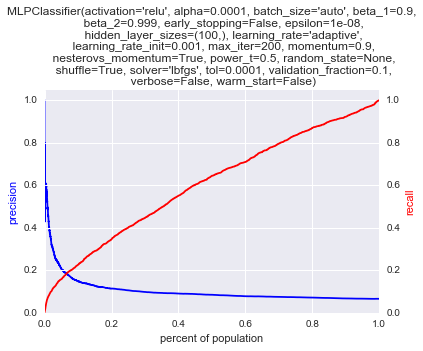

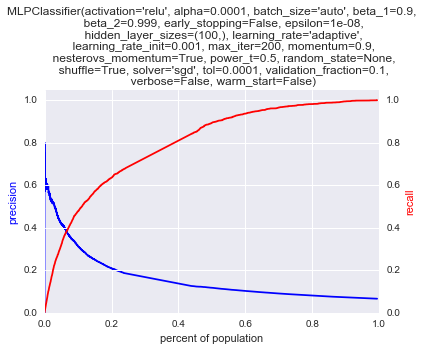

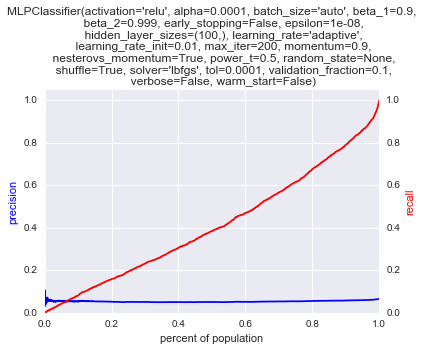

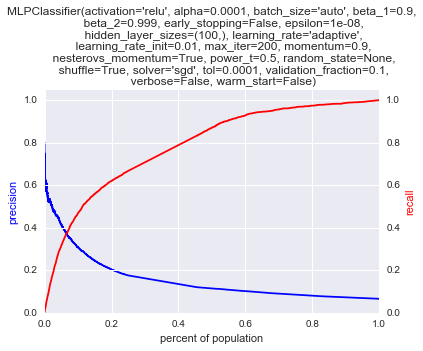

...

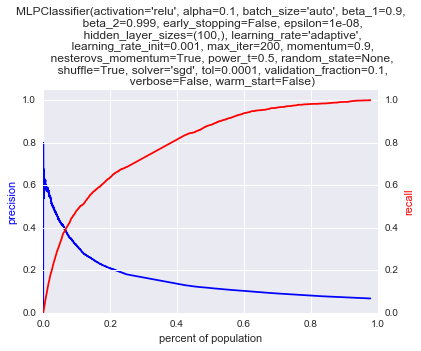

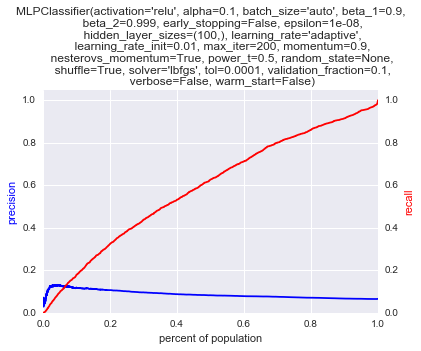

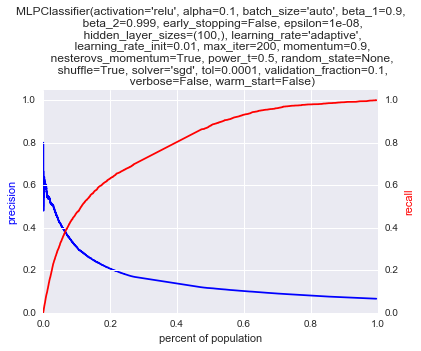

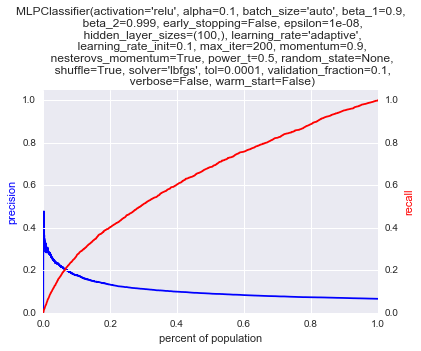

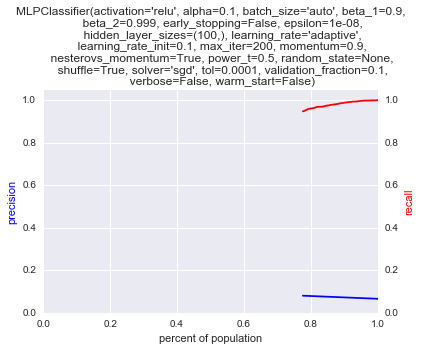

,model_type,clf,parameters,train_time,predict_time,threshold,auc-roc,p_at_1,p_at_20,p_at_50,...,rec_at_20,rec_at_50,rec_at_100,rec_at_150,rec_at_200,rec_at_500,rec_at_1000,rec_at_2000,rec_at_5000,rec_at_All
0,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_features': 'sqrt', 'max_depth': 5, 'min_...",0.653672,0.116421,0.10,0.852636,1.0,0.55,0.66,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000
1,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_features': 'sqrt', 'max_depth': 5, 'min_...",0.653672,0.116421,0.15,0.852636,1.0,0.55,0.66,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000
2,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_features': 'sqrt', 'max_depth': 5, 'min_...",0.653672,0.116421,0.20,0.852636,1.0,0.55,0.66,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.989399
3,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_features': 'sqrt', 'max_depth': 5, 'min_...",0.653672,0.116421,0.25,0.852636,1.0,0.55,0.66,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.965169
4,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_features': 'sqrt', 'max_depth': 5, 'min_...",0.653672,0.116421,0.30,0.852636,1.0,0.55,0.66,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.915194


In [49]:
results_df_oversampling = predictions.clf_loop(models_to_run, clfs, grid, X_train_oversample, X_test_val, 
                                  y_train_oversample, y_test_val, list_ks, list_thresholds, print_plots = True)
results_df_oversampling.head()
results_df_oversampling.to_csv('results_oversampling.csv', index=False)

----
# Retraining best model to get final performance estimate

In [71]:
# We have identified the best model. We will now retrain on all of the training data
# and then have it predict on the test data in order to get an expectation for how well it will
# perform on unseen data.

In [106]:
# The best model was trained with scaled data, so we will scale the complete training 
# data as well.
scaler = preprocessing.RobustScaler().fit(X_train[non_binary_columns])

X_train.loc[:,non_binary_columns] = scaler.transform(X_train[non_binary_columns])
X_test.loc[:,non_binary_columns] = scaler.transform(X_test[non_binary_columns])

rus = RandomOverSampler(random_state=42)
X_train_oversampled, y_train_oversampled = rus.fit_sample(X_train, y_train)

print('Original dataset shape {}'.format(Counter(y_train)))
print('Resampled dataset shape {}'.format(Counter(y_train_oversampled)))

Original dataset shape Counter({0: 93727, 1: 6773})
Resampled dataset shape Counter({0: 93727, 1: 93727})


NN


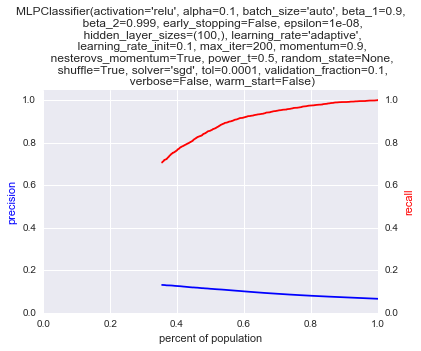

In [122]:
from sklearn.neural_network import MLPClassifier

models_to_run = ['NN']
clf = {'NN': MLPClassifier()}

grid = {'NN': {'activation': ["relu"], 'solver': ["sgd"], "alpha": [0.1],
            'learning_rate': ["adaptive"], 'learning_rate_init': [0.1]}}

list_thresholds = [0.15]

result_best_model = predictions.clf_loop(models_to_run, clf, grid, X_train_oversampled, X_test, 
                                  y_train_oversampled, y_test, list_ks, list_thresholds, print_plots = True)

In [123]:
evaluation.add_f1_score(result_best_model, "p_at_1000", "rec_at_1000", "f1_at_1000")
evaluation.add_f1_score(result_best_model, "p_at_2000", "rec_at_2000", "f1_at_2000")

In [124]:
result_best_model

,model_type,clf,parameters,train_time,predict_time,threshold,auc-roc,p_at_1,p_at_20,p_at_50,...,rec_at_100,rec_at_150,rec_at_200,rec_at_500,rec_at_1000,rec_at_2000,rec_at_5000,rec_at_All,f1_at_1000,f1_at_2000
0,NN,"MLPClassifier(activation='relu', alpha=0.1, ba...","{'solver': 'sgd', 'learning_rate': 'adaptive',...",96.038785,0.092818,0.15,0.732341,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.971718,1.0,1.0


In [125]:
result_best_model[["p_at_1000", "rec_at_1000", "f1_at_1000", "p_at_2000", "rec_at_2000", "f1_at_2000"]]

,p_at_1000,rec_at_1000,f1_at_1000,p_at_2000,rec_at_2000,f1_at_2000
0,1.0,1.0,1.0,1.0,1.0,1.0


In [126]:
result_best_model.iloc[0]

model_type                                                     NN
clf             MLPClassifier(activation='relu', alpha=0.1, ba...
parameters      {'solver': 'sgd', 'learning_rate': 'adaptive',...
train_time                                                96.0388
predict_time                                             0.092818
threshold                                                    0.15
auc-roc                                                  0.732341
p_at_1                                                          1
p_at_20                                                         1
p_at_50                                                         1
p_at_100                                                        1
p_at_150                                                        1
p_at_200                                                        1
p_at_500                                                        1
p_at_1000                                                       1
p_at_2000 